# seqFISH analyses

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
from time import time
import copy

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV
from scipy.stats import loguniform

import umap
# if not installed run: conda install -c conda-forge umap-learn
import hdbscan
from sklearn.cluster import OPTICS, cluster_optics_dbscan

In [ ]:
# Convenient IPython console
# comment it if you execute Jupyterlab on a remote server
# %qtconsole --style monokai
# and use instead
%connect_info
# then jupyter qtconsole --style monokai --existing ./remote_kernel-1 --ssh alexis@CRCT2112

In [3]:
import sys
sys.path.extend(['../../tysserand', '../../NeighborsAggregationStatistics'])

In [4]:
from tysserand import tysserand as ty
from nas import nas

In [221]:
# If need to reload modules after their modification
from importlib import reload
ty = reload(ty)
nas = reload(nas)
sns = reload(sns)
plt = reload(plt)

In [5]:
data_dir = Path("../data/seqFISH")
seqFISH_path = data_dir / "seqfish_cortex_b2_testing.txt"
seqFISH_labels_path = data_dir / "seqfish_labels.tsv"
seqFISH_coords_path = data_dir / "fcortex.coordinates.txt"

### seqFISH data

txt file of normalized seqFISH data for `113 genes x 1597 cells`

In [6]:
seqFISH = pd.read_csv(seqFISH_path, sep='\t', header=None, index_col=0)
seqFISH.index.name= 'genes'
seqFISH = seqFISH.transpose()
seqFISH.index.name = 'cells'
seqFISH.head()

genes,abca15,abca9,acta2,adcy4,aldh3b2,amigo2,ankle1,ano7,anxa9,arhgef26,...,spag6,sumf2,tbr1,tnfrsf1b,vmn1r65,vps13c,wrn,zfp182,zfp715,zfp90
cells,,,,,,,,,,,,,,,,,,,,,
1,68.0,41.0,25.0,39.0,101.0,93.0,41.0,44.0,53.0,38.0,...,41.0,36.0,101.0,61.0,38.0,63.0,36.0,97.0,32.0,35.0
2,49.0,42.0,23.0,54.0,47.0,64.0,42.0,68.0,40.0,40.0,...,101.0,36.0,101.0,42.0,39.0,31.0,38.0,35.0,33.0,35.0
3,50.0,38.0,16.0,37.0,41.0,93.0,76.0,50.0,43.0,42.0,...,39.0,46.0,101.0,33.0,54.0,43.0,31.0,36.0,86.0,46.0
4,39.0,36.0,21.0,18.0,52.0,93.0,40.0,48.0,39.0,45.0,...,39.0,33.0,101.0,49.0,60.0,34.0,51.0,36.0,18.0,37.0
5,31.0,47.0,29.0,37.0,101.0,93.0,46.0,50.0,31.0,46.0,...,62.0,0.0,101.0,28.0,51.0,47.0,24.0,26.0,35.0,40.0


### seqFISH labels

tsv file of cell type labels for seqFISH

In [7]:
seqFISH_labels = pd.read_csv(seqFISH_labels_path, sep='\t', header=None)
seqFISH_labels.head()

,0,1,2,3,4,5
0,1,5,Glutamatergic Neuron,3,-,0.982793
1,2,5,Glutamatergic Neuron,3,-,0.944590
2,3,5,Glutamatergic Neuron,3,-,0.829923
3,4,5,Glutamatergic Neuron,3,-,0.465946
4,5,5,Glutamatergic Neuron,3,-,0.986380


In [8]:
seqFISH_counts = seqFISH_labels.groupby(2)[2].value_counts()
seqFISH_counts.index = seqFISH_counts.index.droplevel()
seqFISH_counts.index.name = 'phenotype'
seqFISH_counts

phenotype
Astrocyte                97
Endothelial Cell         11
GABA-ergic Neuron       556
Glutamatergic Neuron    859
Microglia                22
Oligodendrocyte.1         8
Oligodendrocyte.2        21
Oligodendrocyte.3        23
Name: 2, dtype: int64

### seqFISH coordinates

Spatial cell coordinates

In [9]:
nodes = pd.read_csv(seqFISH_coords_path, sep=' ', header=None, usecols=[2,3], names=['x','y'])
nodes = nodes.join(seqFISH_labels[2])
nodes.rename(columns={2:'cell type'}, inplace=True)
attributes = ['cell type']
nodes.head()

,x,y,cell type
0,265.76,-231.14,Glutamatergic Neuron
1,290.48,-261.52,Glutamatergic Neuron
2,257.12,-133.35,Glutamatergic Neuron
3,753.46,-261.14,Glutamatergic Neuron
4,700.01,-169.05,Glutamatergic Neuron


In [10]:
imdir = Path("../images")
SIZE_NODES = 35

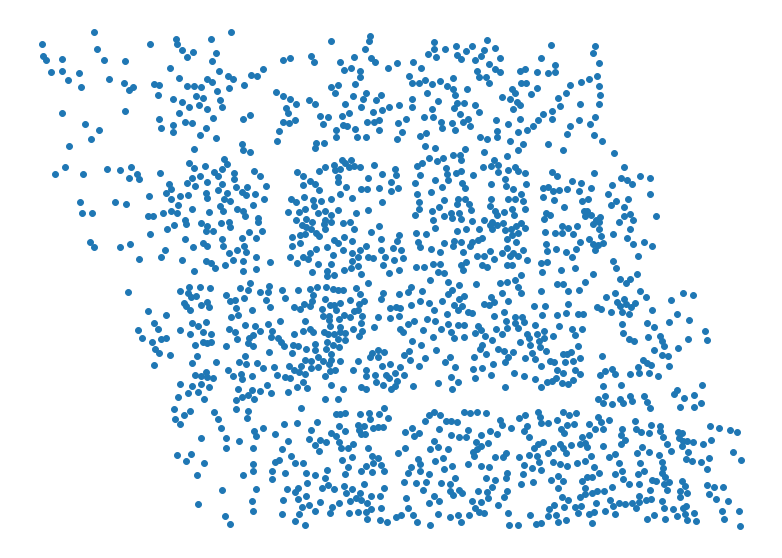

In [503]:
fig, ax = plt.subplots(figsize=(17,10))
ax.scatter(coords[:,0], coords[:,1], s=SIZE_NODES)
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(imdir.joinpath('seqFISH - scatter'), bbox_inches=('tight'))

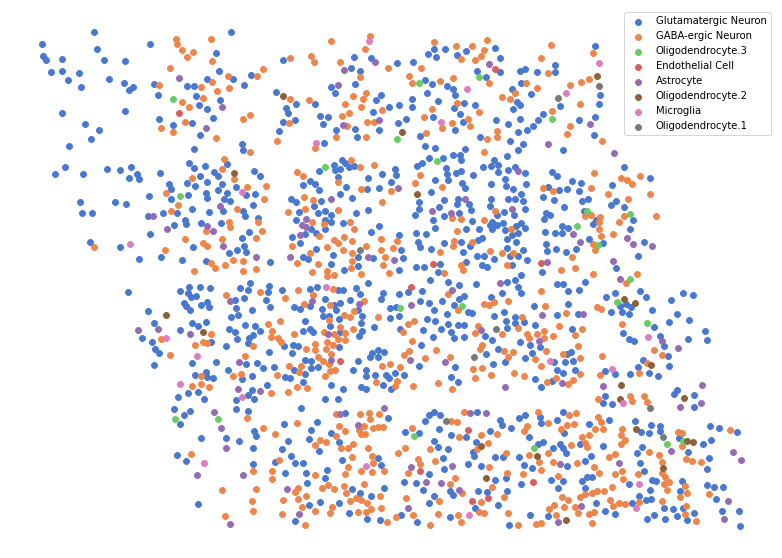

In [504]:
fig, ax = plt.subplots(figsize=(17,10))
labels = nodes['cell type']
uniq = labels.unique()
# color nodes with manual colors
att_colors = sns.color_palette('muted').as_hex() 
color_mapper = dict(zip(uniq, att_colors))
for label in uniq:
    select = labels == label
    color = color_mapper[label]
    ax.scatter(coords[select,0], coords[select,1], c=color, label=label, s=SIZE_NODES)
plt.legend()
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(imdir.joinpath('seqFISH - scatter cell type'), bbox_inches=('tight'))

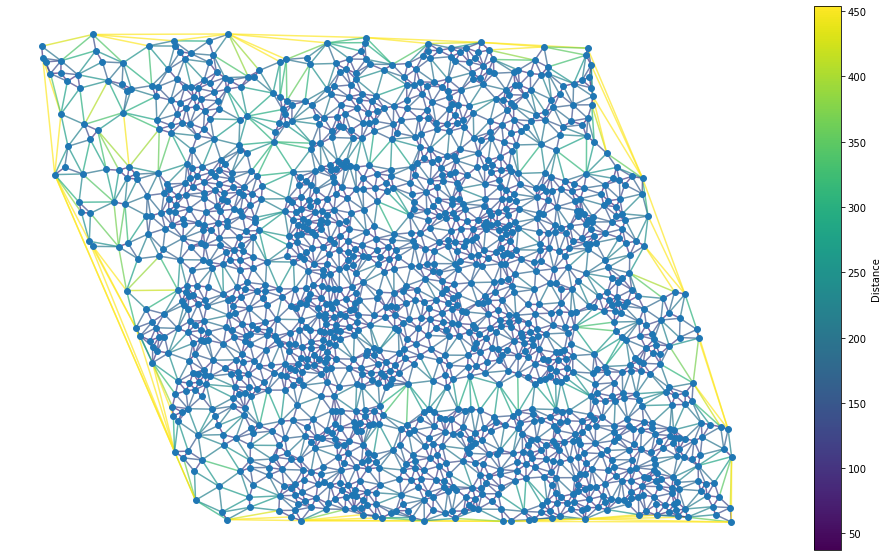

In [505]:
coords = nodes.loc[:,['x','y']].values
pairs = ty.build_voronoi(coords, trim_dist=False)
distances = ty.distance_neighbors(coords, pairs)
fig, ax = ty.plot_network_distances(coords, pairs, distances, size_nodes=SIZE_NODES, figsize=(17,10))
ax.set_axis_off()
plt.savefig(imdir.joinpath('seqFISH - distances'), bbox_inches=('tight'))

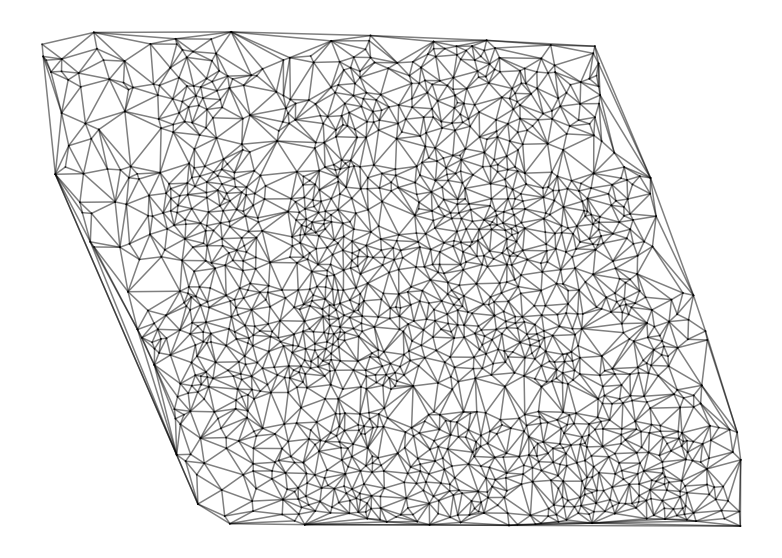

In [506]:
fig, ax = plt.subplots(figsize=(17,10))
for pair in pairs[:,:]:
    [x0, y0], [x1, y1] = coords[pair]
    ax.plot([x0, x1], [y0, y1], c='k', alpha=0.5)
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(imdir.joinpath('seqFISH - all edges'), bbox_inches=('tight'))

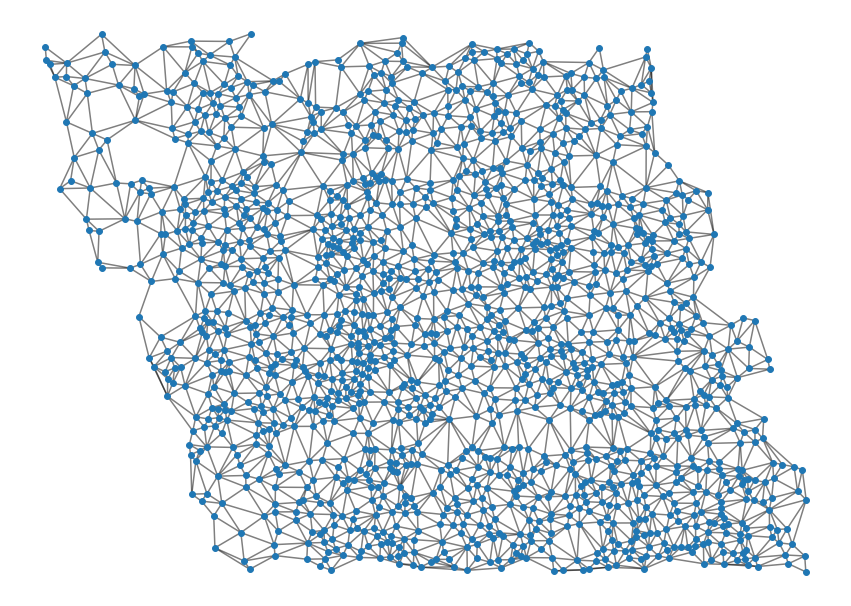

In [507]:
dist_threshold = 350
select = distances < dist_threshold
fig, ax = ty.plot_network(coords, pairs[select,:], size_nodes=SIZE_NODES)
ax.set_axis_off()
plt.savefig(imdir.joinpath('seqFISH - trimmed'), bbox_inches=('tight'))

In [15]:
pairs = pairs[select,:]
edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
nodes = nodes.join(pd.get_dummies(nodes['cell type']))
att = nodes['cell type']
attributes = nodes['cell type'].unique()
nodes.head()

,x,y,cell type,Astrocyte,Endothelial Cell,GABA-ergic Neuron,Glutamatergic Neuron,Microglia,Oligodendrocyte.1,Oligodendrocyte.2,Oligodendrocyte.3
0,265.76,-231.14,Glutamatergic Neuron,0,0,0,1,0,0,0,0
1,290.48,-261.52,Glutamatergic Neuron,0,0,0,1,0,0,0,0
2,257.12,-133.35,Glutamatergic Neuron,0,0,0,1,0,0,0,0
3,753.46,-261.14,Glutamatergic Neuron,0,0,0,1,0,0,0,0
4,700.01,-169.05,Glutamatergic Neuron,0,0,0,1,0,0,0,0


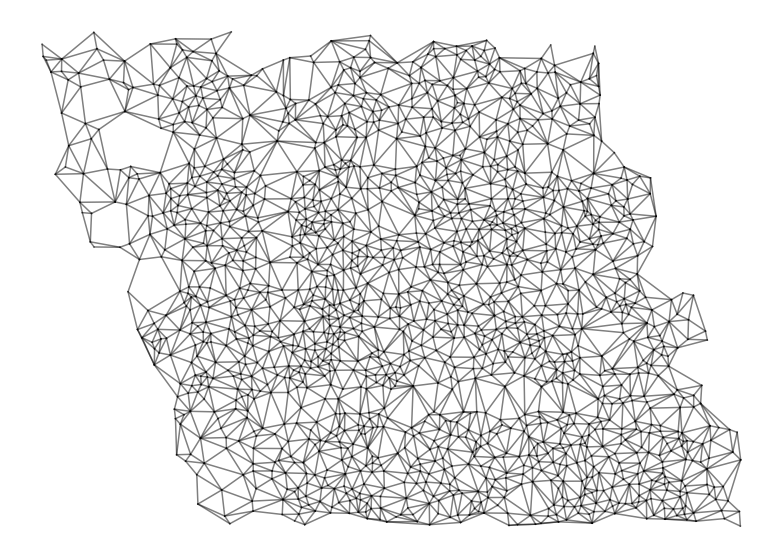

In [509]:
fig, ax = plt.subplots(figsize=(17,10))
for pair in pairs[:,:]:
    [x0, y0], [x1, y1] = coords[pair]
    ax.plot([x0, x1], [y0, y1], c='k', alpha=0.5)
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(imdir.joinpath('seqFISH - trimmed edges'), bbox_inches=('tight'))

### Network overview

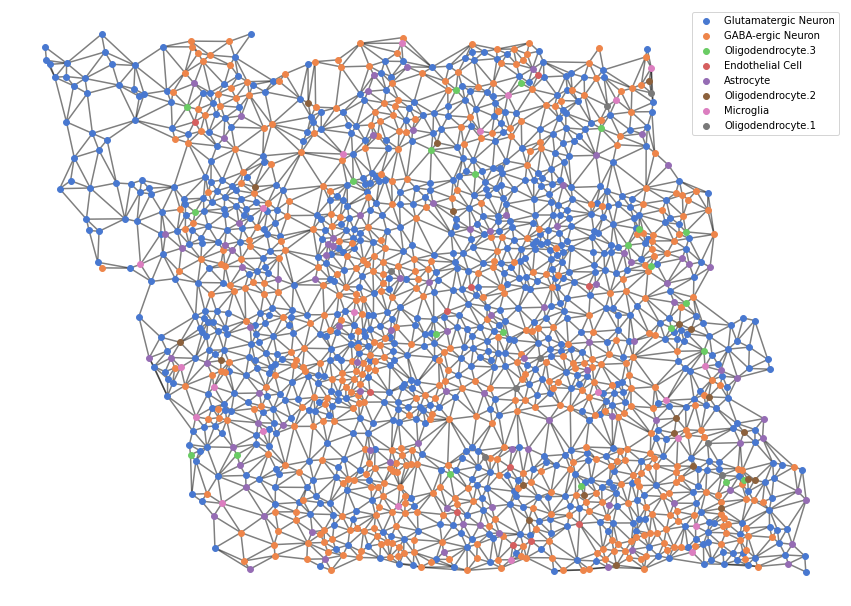

In [194]:
fig, ax = ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=SIZE_NODES)
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(imdir.joinpath('seqFISH - final network'), bbox_inches=('tight'))

In [196]:
# fig, ax = ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=50, figsize=(30,30))
# ax.set_axis_off()
# ax.set_aspect('equal')
# plt.savefig(imdir.joinpath('seqFISH - final network - bigsize'), bbox_inches=('tight'))

## Assortativity

In [308]:
# Network statistics
mixmat = nas.mixing_matrix(nodes, edges, attributes)
assort = nas.attribute_ac(mixmat)

# ------ Randomization ------
mixmat_rand, assort_rand = nas.randomized_mixmat(nodes, edges, attributes, n_shuffle=500, parallel=False)
mixmat_mean, mixmat_std, mixmat_zscore = nas.zscore(mixmat, mixmat_rand, return_stats=True)
assort_mean, assort_std, assort_zscore = nas.zscore(assort, assort_rand, return_stats=True)

randomization: 100%|██████████| 500/500 [01:07<00:00,  7.36it/s]


In [309]:
mixmat = nas.mixmat_to_df(mixmat, attributes)
mixmat_zscore = nas.mixmat_to_df(mixmat_zscore, attributes)

Assortativity by cell types: 0.09002499318302153
Z-scored assortativity by cell types: 8.03905550939124


<AxesSubplot:>

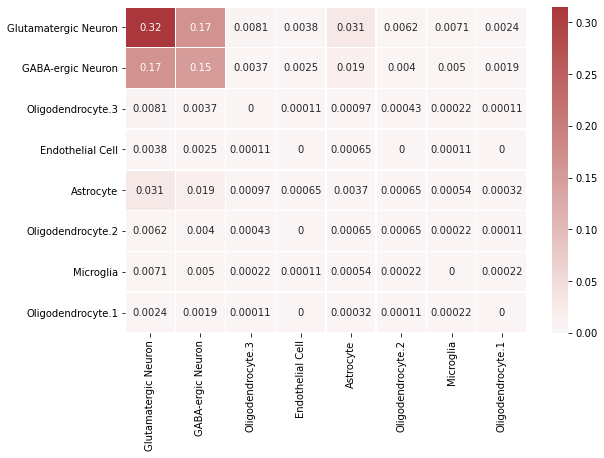

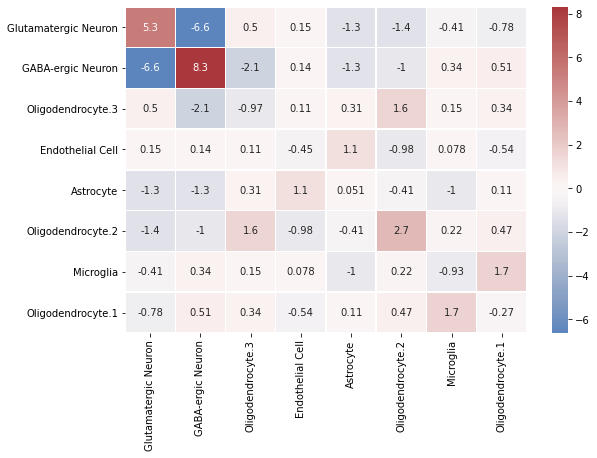

In [310]:
print("Assortativity by cell types: {}".format(assort))
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(mixmat, center=0, cmap="vlag", annot=True, linewidths=.5, ax=ax)

print("Z-scored assortativity by cell types: {}".format(assort_zscore))
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(mixmat_zscore, center=0, cmap="vlag", annot=True, linewidths=.5, ax=ax)

## NAS analysis

In [16]:
SOFT_CLUST = True

/!\ We do the gene selection as done during the BIRS Biointegration workshop.  
But we shouldn't perform this kind of elimination if we are interested in communities discovery.

In [18]:
def successive_elimination(list_elems, elems_id):
    """
    Compute the order of discarded elements during 
    successive deletions at indicated indices.
    
    Parameters
    ----------
    list_elems : list
        A list of elements that are eliminated
    elems_id: list
        A list of indices where elements are successively deleted
    
    Returns
    -------
    successive : list
        The ordered list of deleted elements
    
    Examples
    --------
    >>> gene_names = list(scRNAseq.columns)
    >>> order_elim_id = elimination_report[:,0].astype(int)
    >>> order_elim = successive_elimination(gene_names, genes_elim_id)
    """
    
    from copy import deepcopy
    elems = deepcopy(list_elems)
    
    successive = []
    for i in elems_id:
        successive.append(elems.pop(i))
    
    return successive

In [19]:
elimination_report = np.loadtxt("../data/seqFISH/elimination_report-balanced-accuracy.csv", skiprows=1, delimiter=',')

# Keep the minimum number of genes that lead to good predictions
gene_names = list(seqFISH.columns)
# nb_elim = 86 # optimal number of genes to discard
nb_elim = 94 # eliminate more genes, with still good performance
order_elim_id = elimination_report[:,0].astype(int)
order_elim = successive_elimination(gene_names, order_elim_id)
genes_elim = order_elim[:nb_elim]

seqFISH_drop = copy.deepcopy(seqFISH)
seqFISH_drop.drop(columns=genes_elim, inplace=True)
scaler_seq = StandardScaler() # for seqFISH
Xgene = scaler_seq.fit_transform(seqFISH_drop)  
print(f"There are {Xpred.shape[1]} remaining genes")

NameError: name 'Xpred' is not defined

#### First order neighbors

In [314]:
genes_aggreg = nas.aggregate_k_neighbors(X=Xgene, pairs=pairs, order=1, var_names=seqFISH_drop.columns)

In [20]:
# For the visualization
marker = 'o'
size_points = 10

In [316]:
reducer = umap.UMAP(random_state=0)
embedding = reducer.fit_transform(genes_aggreg)
embedding.shape

(1597, 2)

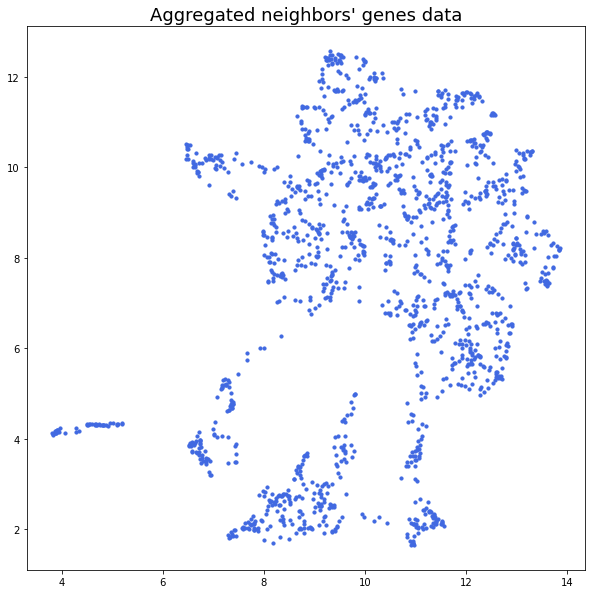

In [317]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' genes data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

The UMAP is different from the one during the BIRS workshop

In [318]:
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=15, min_samples=1, prediction_data=True)
    clusterer.fit(embedding)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=15, min_samples=1, prediction_data=True)
    labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 45 clusters


we choose `min_samples=1` to avoid having points considered as noise

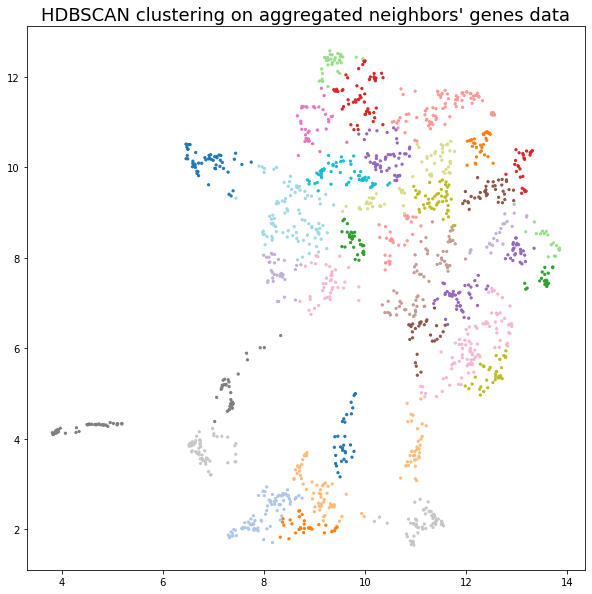

In [319]:
hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_hdbs,
            s=5,
            cmap=hdbs_cmap);

title = "HDBSCAN clustering on aggregated neighbors' genes data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

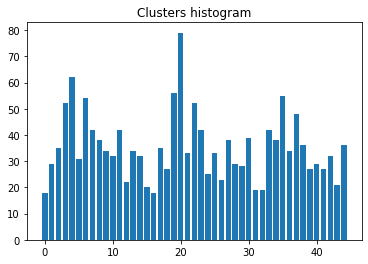

In [320]:
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

#### Visualisation of spatial seqFISH data and detected areas 

No handles with labels found to put in legend.


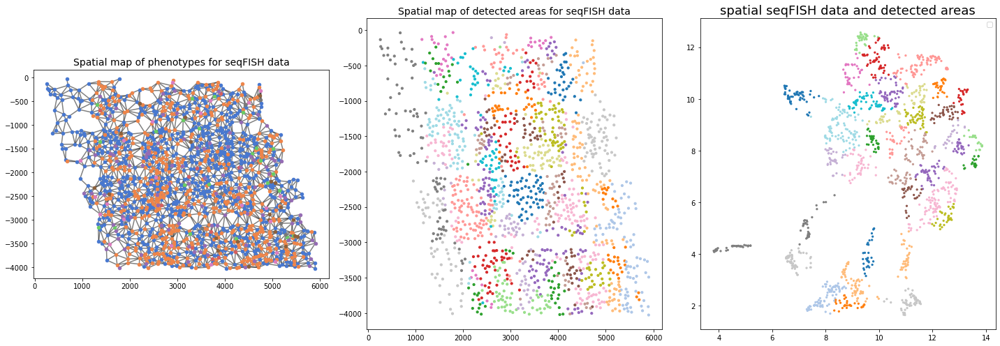

In [321]:
fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=True)

ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[2].scatter(embedding[:, 0], embedding[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

title = "spatial seqFISH data and detected areas"
plt.title(title, fontsize=18);

In [517]:
# For the visualization
marker = 'o'
size_points = 10

order = 1
dim_clust = 5
min_cluster_size = 30
nb_genes = Xpred.shape[1]

# compute statistics on aggregated data across neighbors
genes_aggreg = nas.aggregate_k_neighbors(X=Xpred, pairs=pairs, order=order, var_names=seqFISH_drop.columns)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)


# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(genes_aggreg)

# Clustering
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    clusterer.fit(embed_clust)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
    clusterer.fit(embed_clust)
    labels_hdbs = clusterer.labels_

hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 8 clusters


No handles with labels found to put in legend.


Text(0.5, 0.98, 'Spatial seqFISH data and detected areas - nb_genes 19 - order 1 - dim_clust 5 - min_cluster_size 30')

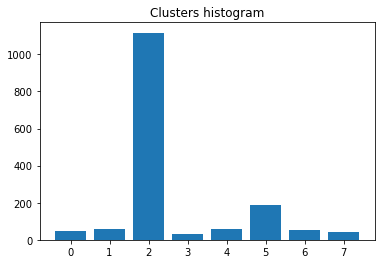

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


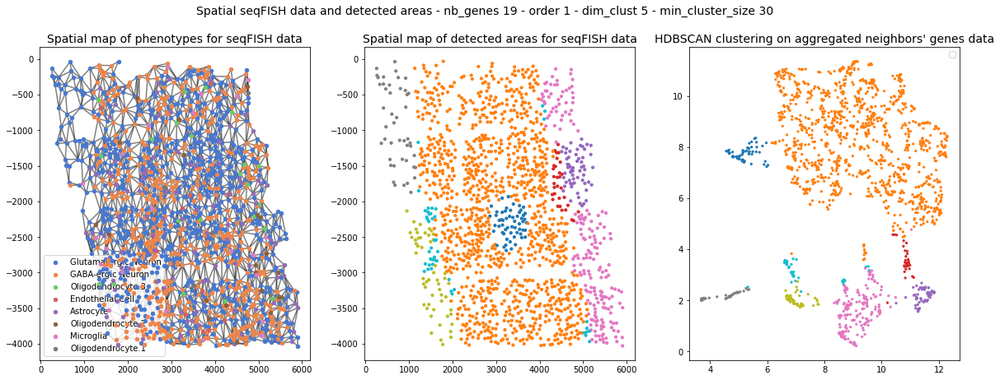

In [518]:
# Histogram of classes
fig = plt.figure()
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

# Big summary plot
fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=False)

ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0], aspect=None)
ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);
ax[0].legend()

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
fig.suptitle(suptitle, fontsize=14)

#### manual identification of clusters

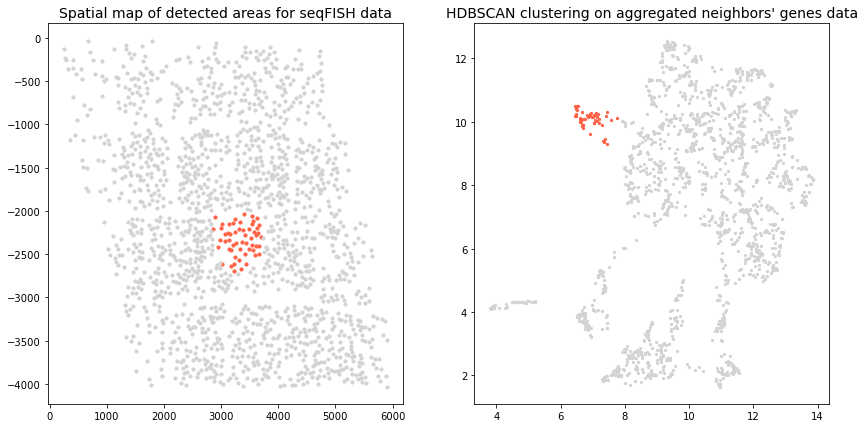

In [324]:
clust_id = 1
clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

ax[0].scatter(nodes.loc[clust_targ,'x'], nodes.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
ax[0].scatter(nodes.loc[clust_comp,'x'], nodes.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
ax[0].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

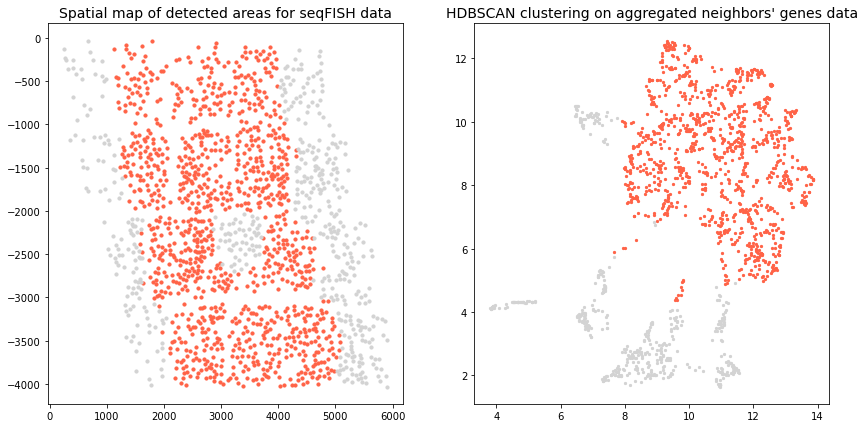

In [325]:
clust_id = 2
clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

ax[0].scatter(nodes.loc[clust_targ,'x'], nodes.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
ax[0].scatter(nodes.loc[clust_comp,'x'], nodes.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
ax[0].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

#### Manual DE analysis

In [326]:
from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

var_names = genes_aggreg.columns
distrib_pval = {'Welch': [],
                'Mann-Whitney': [],
                'Kolmogorov-Smirnov': []}
select_1 = labels_hdbs == 1
select_2 = labels_hdbs == 2
for var_name in var_names:
    dist1 = genes_aggreg.loc[select_1, var_name]
    dist2 = genes_aggreg.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
    mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
    distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [327]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

In [328]:
DE_pval.T.style.apply(highlight_under)

,acta2 mean,ankle1 mean,cldn5 mean,csf2rb2 mean,cyp2j5 mean,gda mean,gja1 mean,itpr2 mean,laptm5 mean,mertk mean,mfge8 mean,mgam mean,mmp8 mean,olr1 mean,omg mean,pld1 mean,sox2 mean,tbr1 mean,vmn1r65 mean,acta2 std,ankle1 std,cldn5 std,csf2rb2 std,cyp2j5 std,gda std,gja1 std,itpr2 std,laptm5 std,mertk std,mfge8 std,mgam std,mmp8 std,olr1 std,omg std,pld1 std,sox2 std,tbr1 std,vmn1r65 std
Welch,0.000000,0.000000,0.000000,0.135235,0.492970,0.000000,0.005123,0.181965,0.388088,0.494889,0.934501,0.083003,0.000026,0.328236,0.000013,0.008364,0.000000,0.000000,0.000915,0.347773,0.011273,0.001419,0.561400,0.000038,0.119689,0.000039,0.423315,0.000062,0.337001,0.302901,0.588585,0.957654,0.025531,0.036171,0.002411,0.000000,0.006472,0.854718
Mann-Whitney,0.000000,0.000000,0.000000,0.014258,0.281553,0.000000,0.000752,0.052284,0.251803,0.261067,0.414386,0.086706,0.000127,0.153243,0.000014,0.010653,0.000000,0.000002,0.000112,0.050140,0.058273,0.000006,0.317105,0.000538,0.072839,0.000002,0.142411,0.000039,0.079983,0.031719,0.429233,0.489908,0.019987,0.022797,0.023343,0.000000,0.001091,0.400922
Kolmogorov-Smirnov,0.000000,0.000000,0.000000,0.006481,0.157530,0.000000,0.005798,0.001595,0.581669,0.508738,0.977219,0.131811,0.001688,0.640413,0.000245,0.054772,0.000000,0.000046,0.002205,0.171178,0.019809,0.000000,0.096084,0.004479,0.054958,0.000000,0.053849,0.003052,0.215431,0.001403,0.367428,0.972084,0.146504,0.067572,0.000072,0.000000,0.003436,0.966582


In [329]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

cldn5 mean      0.000000e+00
sox2 std        2.500233e-11
sox2 mean       1.410481e-10
acta2 mean      2.116228e-10
cldn5 std       5.714850e-09
gja1 std        1.081539e-07
ankle1 mean     1.373306e-07
gda mean        3.598312e-07
tbr1 mean       4.604746e-05
pld1 std        7.165222e-05
omg mean        2.445066e-04
mfge8 std       1.402942e-03
itpr2 mean      1.595316e-03
mmp8 mean       1.687630e-03
vmn1r65 mean    2.204969e-03
laptm5 std      3.052029e-03
tbr1 std        3.436184e-03
cyp2j5 std      4.479071e-03
gja1 mean       5.797808e-03
csf2rb2 mean    6.480891e-03
ankle1 std      1.980883e-02
Name: Kolmogorov-Smirnov, dtype: float64

In [330]:
import scanpy as sc

In [331]:
adata = sc.AnnData(genes_aggreg)
adata.obs['cell_clusters'] = pd.Series([str(x) for  x in labels_hdbs], dtype="category").values
# adata.obs['cell_clusters'] = labels_hdbs

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


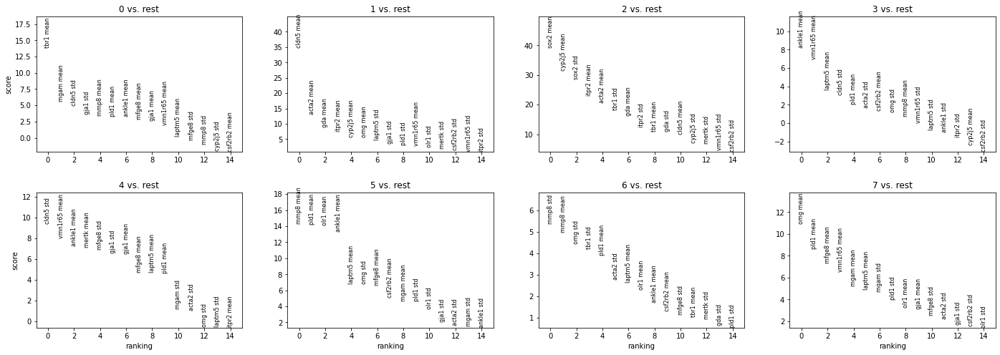

In [332]:
sc.tl.rank_genes_groups(adata, groupby='cell_clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

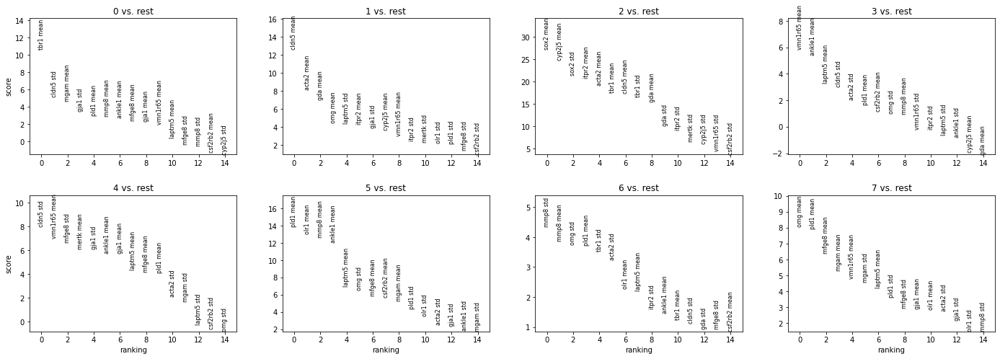

In [333]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


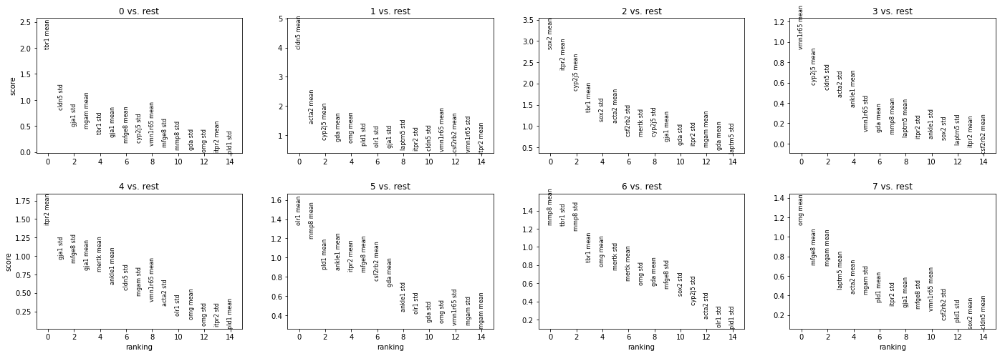

In [334]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

Compare to a single cluster.

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


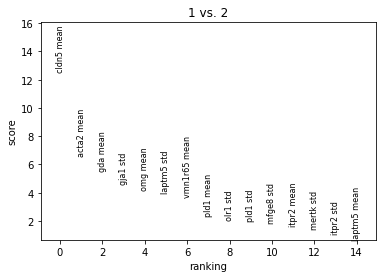

In [335]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', groups=['1'], reference='2', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['1'], n_genes=15)

In [336]:
# error
# sc.pl.rank_genes_groups_violin(adata, groups=['1'], n_genes=8)

In [ ]:
var_names = genes_aggreg.columns
select_1 = labels_hdbs == 1
select_2 = labels_hdbs == 2

dist1 = genes_aggreg.loc[select_1, var_names]
dist2 = genes_aggreg.loc[select_2, var_names]
dist1['cluster'] = 1
dist2['cluster'] = 2
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

In [342]:
wide = dist1.append(dist2)

In [349]:
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

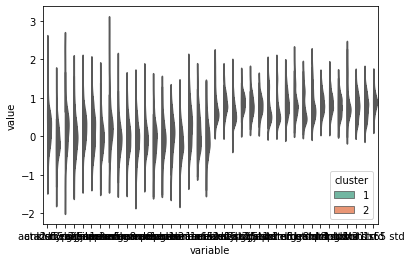

In [354]:
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True,
                    scale="count", inner="stick")

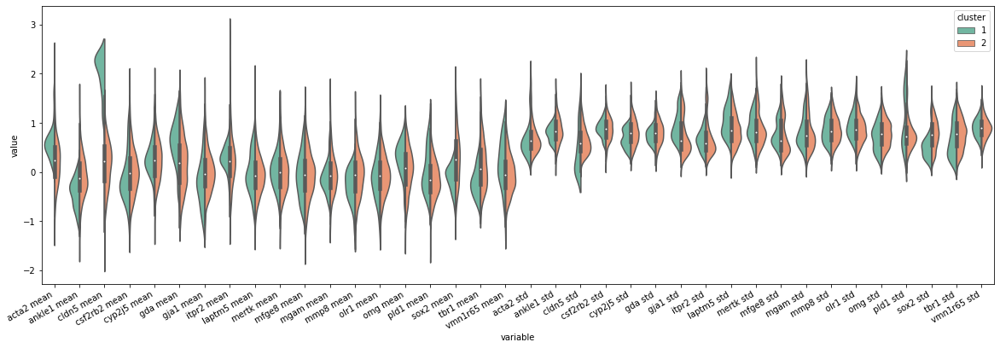

In [410]:
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right');

Distributions that look different are: acta2, cldn5, gda, omg

In [379]:
mean_1 = dist1.loc[:,var_names].mean(axis=0)
mean_2 = dist2.loc[:,var_names].mean(axis=0)
ratio = mean_1 / mean_2
ratio.rename('ratio', inplace=True)

acta2 mean         2.813943
ankle1 mean        4.695257
cldn5 mean        14.169837
csf2rb2 mean      33.881676
cyp2j5 mean        1.143162
gda mean           3.524337
gja1 mean       4546.186276
itpr2 mean         1.219815
laptm5 mean        0.266418
mertk mean        23.317706
mfge8 mean         1.078400
mgam mean          3.486427
mmp8 mean          4.447381
olr1 mean          1.987451
omg mean           7.092283
pld1 mean         -0.169809
sox2 mean         -0.356007
tbr1 mean         -1.111917
vmn1r65 mean      -3.821371
acta2 std          0.936326
ankle1 std         0.926914
cldn5 std          0.678299
csf2rb2 std        1.016215
cyp2j5 std         0.853993
gda std            0.949790
gja1 std           1.242066
itpr2 std          0.961069
laptm5 std         1.211999
mertk std          1.044725
mfge8 std          1.053245
mgam std           0.971939
mmp8 std           1.002157
olr1 std           1.098134
omg std            0.897251
pld1 std           1.299621
sox2 std           0

In [385]:
DE = DE_pval.join(ratio)
DE['logFC'] = np.log(DE['ratio'])
DE['-log10Pvalue'] = -np.log10(DE['Mann-Whitney'])
DE['significant'] = DE['Mann-Whitney'] < 0.05
DE

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Welch,Mann-Whitney,Kolmogorov-Smirnov,ratio,logFC,-log10Pvalue,significant
acta2 mean,7.191296e-12,2.548139e-11,2.116228e-10,2.813943,1.034587,10.593777,True
ankle1 mean,1.301207e-10,2.602245e-09,1.373306e-07,4.695257,1.546553,8.584652,True
cldn5 mean,2.738526e-39,3.419293e-36,0.000000e+00,14.169837,2.651116,35.466064,True
csf2rb2 mean,1.352352e-01,1.425817e-02,6.480891e-03,33.881676,3.522874,1.845936,True
cyp2j5 mean,4.929700e-01,2.815528e-01,1.575298e-01,1.143162,0.133798,0.550440,False
gda mean,3.570795e-08,1.570191e-08,3.598312e-07,3.524337,1.259692,7.804047,True
gja1 mean,5.123203e-03,7.518524e-04,5.797808e-03,4546.186276,8.422044,3.123867,True
itpr2 mean,1.819646e-01,5.228417e-02,1.595316e-03,1.219815,0.198699,1.281630,False
laptm5 mean,3.880884e-01,2.518029e-01,5.816694e-01,0.266418,-1.322690,0.598939,False
mertk mean,4.948886e-01,2.610674e-01,5.087381e-01,23.317706,3.149213,0.583247,False


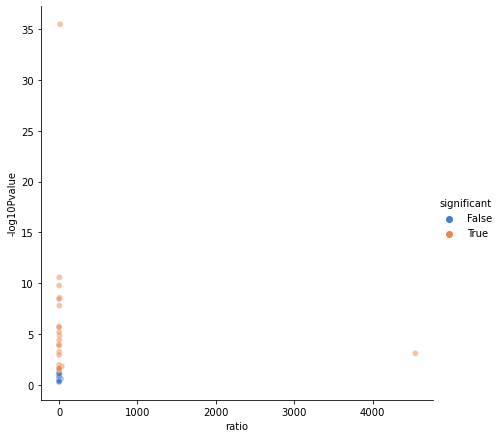

In [404]:
ax = sns.relplot(x="ratio", y="-log10Pvalue", hue="significant",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=DE)

In [403]:
# To annotate points, but there are nan due to negative values in log
# for index, row in DE.loc[DE['significant'], ['logFC', '-log10Pvalue']].iterrows():
# #     plt.annotate('actual group', xy=(x+0.2,y))
#     print(row['logFC'])

gja1 mean is 4000x higher, but only because mean exp of group 2 is supr low.

## With all genes

In [109]:
Xgene = seqFISH.values

#### First order neighbors

In [110]:
genes_aggreg = nas.aggregate_k_neighbors(X=Xgene, pairs=pairs, order=1, var_names=seqFISH.columns)

In [23]:
# For the visualization
marker = 'o'
size_points = 10

In [111]:
reducer = umap.UMAP(random_state=0)
embedding = reducer.fit_transform(genes_aggreg)
embedding.shape

(1597, 2)

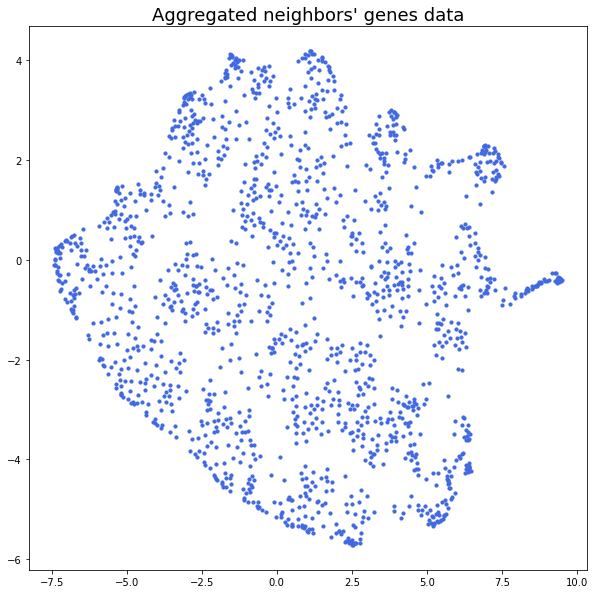

In [112]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' genes data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

The UMAP is different from the one during the BIRS workshop

In [113]:
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=15, min_samples=1, prediction_data=True)
    clusterer.fit(embedding)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=15, min_samples=1, prediction_data=True)
    labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)

HDBSCAN has detected 28 clusters


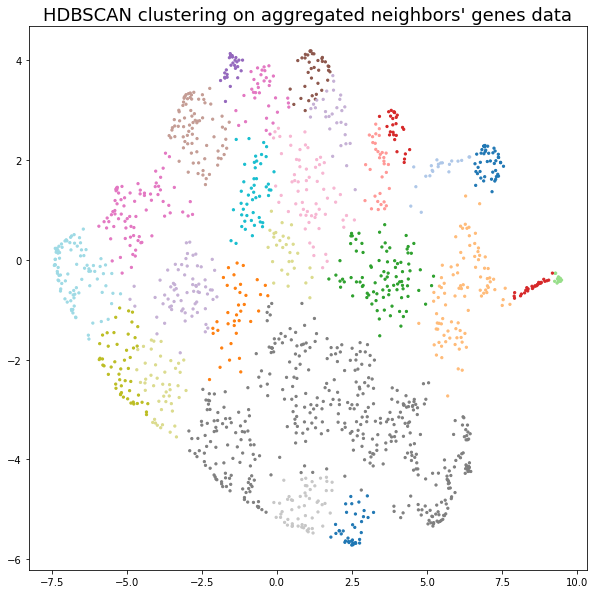

In [114]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_hdbs,
            s=5,
            cmap=hdbs_cmap);

title = "HDBSCAN clustering on aggregated neighbors' genes data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

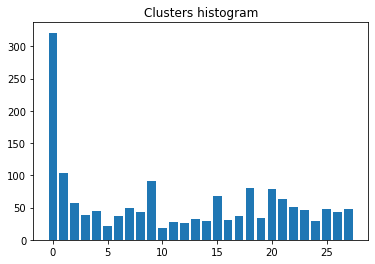

In [115]:
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

#### Visualisation of spatial seqFISH data and detected areas 

No handles with labels found to put in legend.


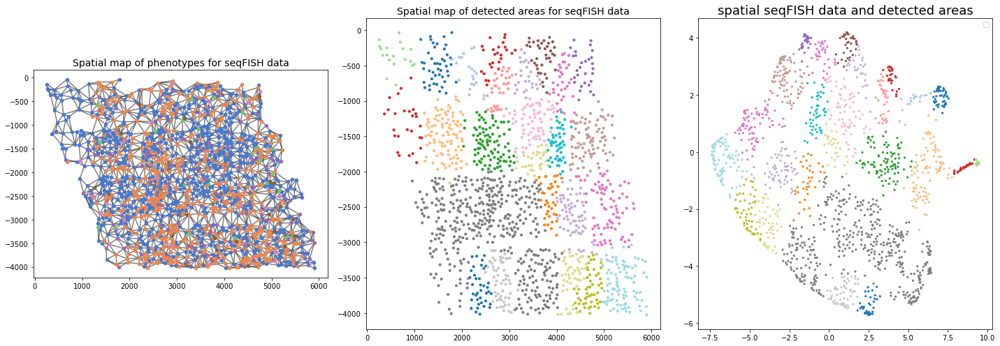

In [116]:
fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=True)

ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[2].scatter(embedding[:, 0], embedding[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

title = "spatial seqFISH data and detected areas"
plt.title(title, fontsize=18);

#### Screening of order and clustering

In [ ]:
# data = seqFISH_drop
# nb_genes = data.shape[1]
# save_dir = Path(f'../data/processed/nb_genes {nb_genes}')
# if not os.path.exists(save_dir):
#     os.makedirs(save_dir)

# orders = [1, 2, 3]

# for order in orders:
#     # compute statistics on aggregated data across neighbors
#     genes_aggreg = nas.aggregate_k_neighbors(X=data.values, pairs=pairs, order=order, var_names=data.columns)
    
#     # Dimension reduction for visualization
#     embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)

#     for dim_clust in [2,3,4,5,6,7,8,9]:
#         # Dimension reduction for clustering
#         embed_clust = umap.UMAP(n_neighbors=30,
#                                 min_dist=0.0,
#                                 n_components=dim_clust,
#                                 random_state=0,
#                                ).fit_transform(genes_aggreg)

#         for min_cluster_size in [10,20,30,40,50,60]:
#             # Clustering
#             if SOFT_CLUST:
#                 clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
#                 clusterer.fit(embed_clust)
#                 soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
#                 labels_hdbs = soft_clusters.argmax(axis=1)
#             else:
#                 clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
#                 clusterer.fit(embed_clust)
#                 labels_hdbs = clusterer.labels_
#             nb_clust_hdbs = labels_hdbs.max() + 1
#             print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
#             hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)

# #             # Histogram of classes
# #             fig = plt.figure()
# #             class_id, class_count = np.unique(labels_hdbs, return_counts=True)
# #             plt.bar(class_id, class_count, width=0.8);
# #             plt.title('Clusters histogram');
# #             title = f"Clusters histogram - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
# #             plt.savefig(save_dir / title, bbox_inches='tight')
# #             plt.show()            
                        
#             # Big summary plot
#             fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=False)

# #             ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0])
# #             ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);
# #             ax[0].legend()

#             ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
#             ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

#             ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
#             ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

#             suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
#             fig.suptitle(suptitle, fontsize=14)

#             fig.savefig(save_dir / suptitle, bbox_inches='tight')
#             plt.show()

In [321]:
# For the visualization
marker = 'o'
size_points = 10

data = seqFISH
order = 3
dim_clust = 3
min_cluster_size = 40
nb_genes = data.shape[1]

# compute statistics on aggregated data across neighbors
genes_aggreg = nas.aggregate_k_neighbors(X=data.values, pairs=pairs, order=order, var_names=data.columns)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)


# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(genes_aggreg)

# Clustering
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    clusterer.fit(embed_clust)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
    clusterer.fit(embed_clust)
    labels_hdbs = clusterer.labels_

hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 15 clusters


No handles with labels found to put in legend.


Text(0.5, 0.98, 'Spatial seqFISH data and detected areas - nb_genes 113 - order 1 - dim_clust 3 - min_cluster_size 40')

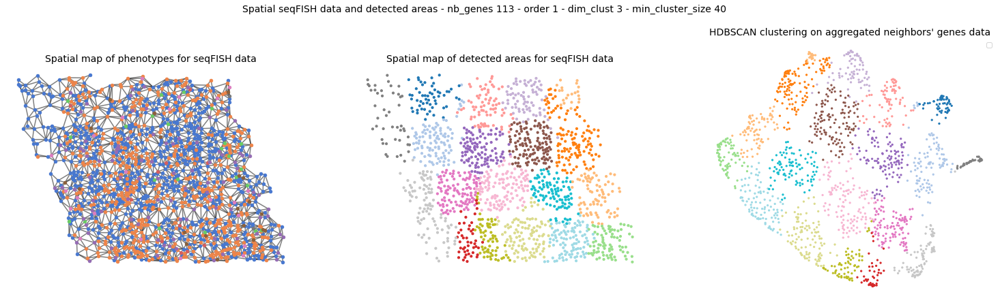

In [208]:
# # Histogram of classes
# fig = plt.figure()
# class_id, class_count = np.unique(labels_hdbs, return_counts=True)
# plt.bar(class_id, class_count, width=0.8);
# plt.title('Clusters histogram');

# Big summary plot
fig, ax = plt.subplots(1, 3, figsize=(26,7), tight_layout=False)

ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);
ax[0].set_axis_off()

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);
ax[1].set_aspect('equal')
ax[1].set_axis_off()

ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);
ax[1].set_aspect('equal')
ax[2].set_axis_off()

suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
fig.suptitle(suptitle, fontsize=14)

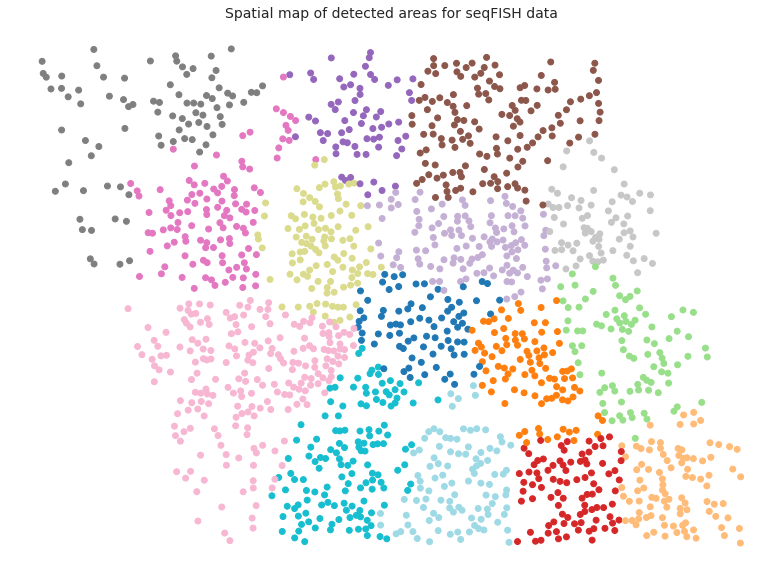

In [322]:
fig, ax = plt.subplots(figsize=(17,10))
ax.scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=35)
ax.set_title('Spatial map of detected areas for seqFISH data', fontsize=14);
ax.set_aspect('equal')
ax.set_axis_off()
plt.savefig(imdir.joinpath(f'seqFISH - detected area - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}'), 
            bbox_inches=('tight'))

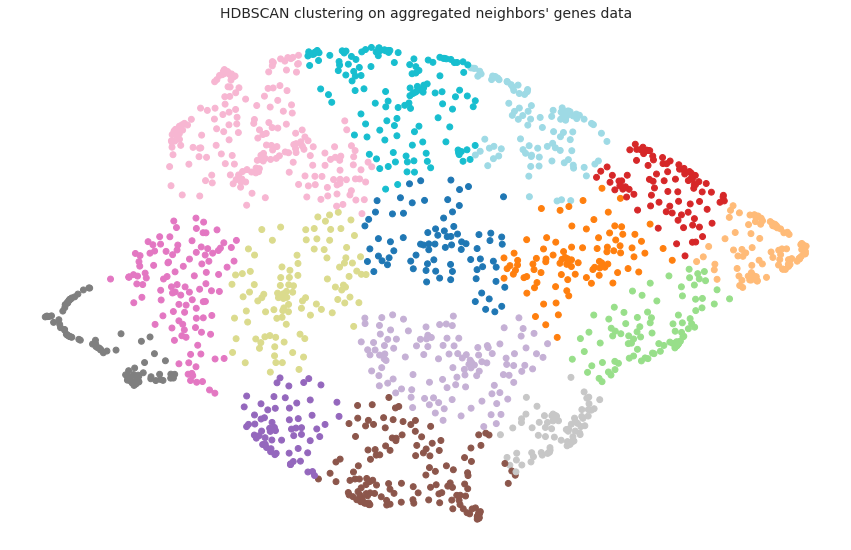

In [323]:
fig, ax = plt.subplots(figsize=(15,10))
ax.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=35, cmap=hdbs_cmap);
ax.set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);
ax.set_aspect('equal')
ax.set_axis_off()
plt.savefig(imdir.joinpath(f'seqFISH - clustering - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}'),
            bbox_inches=('tight'))

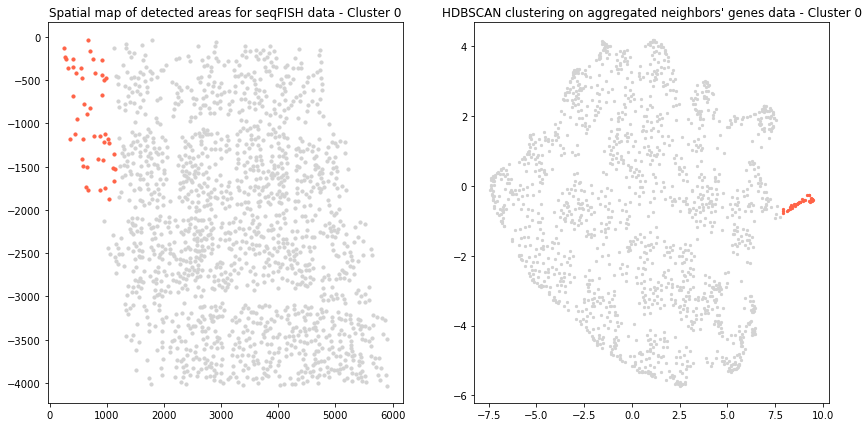

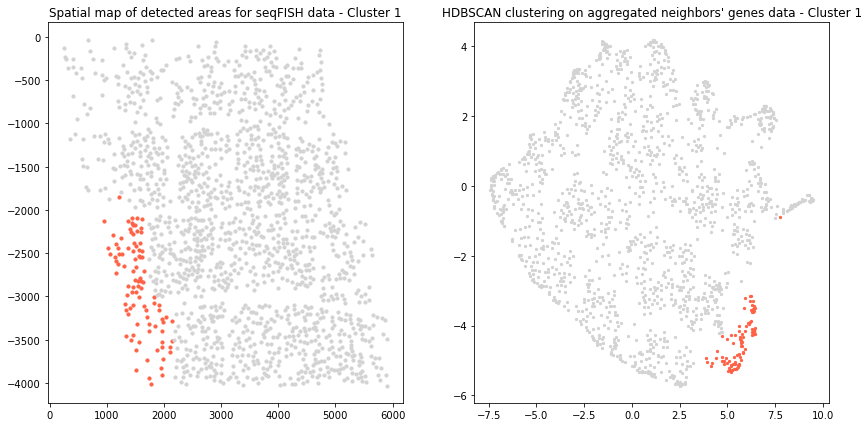

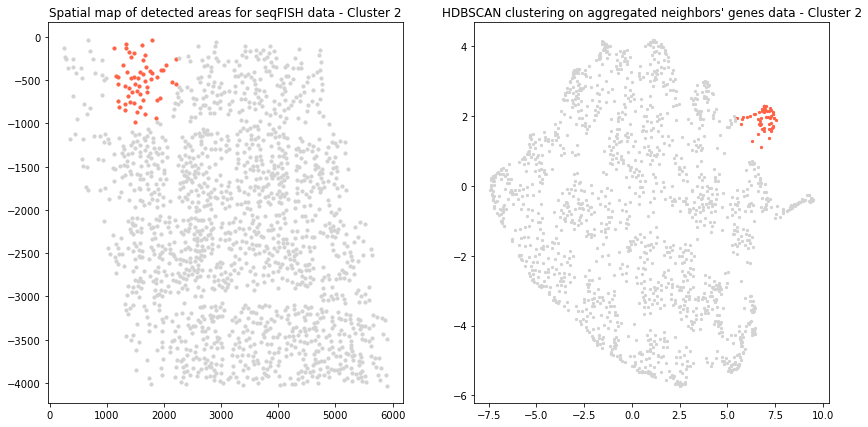

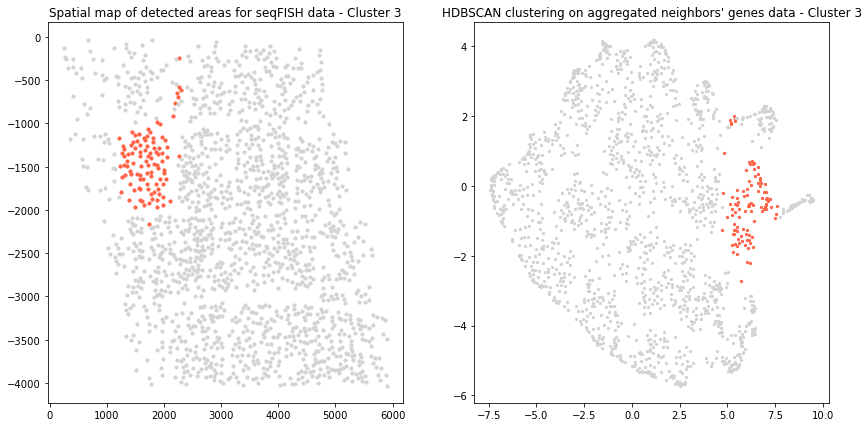

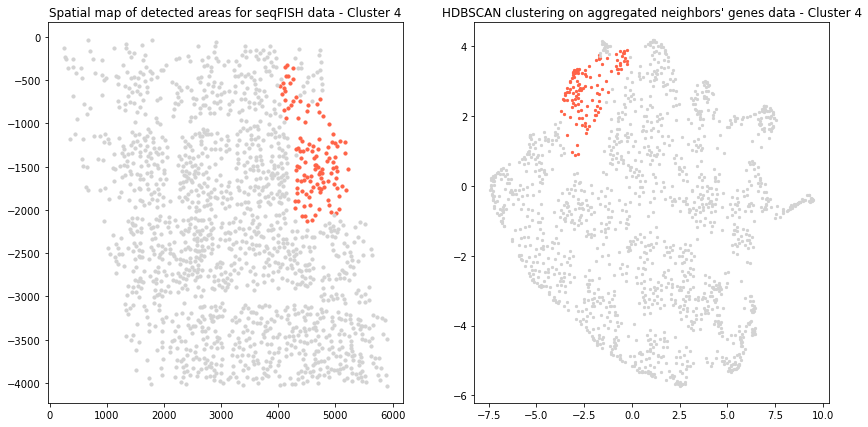

...

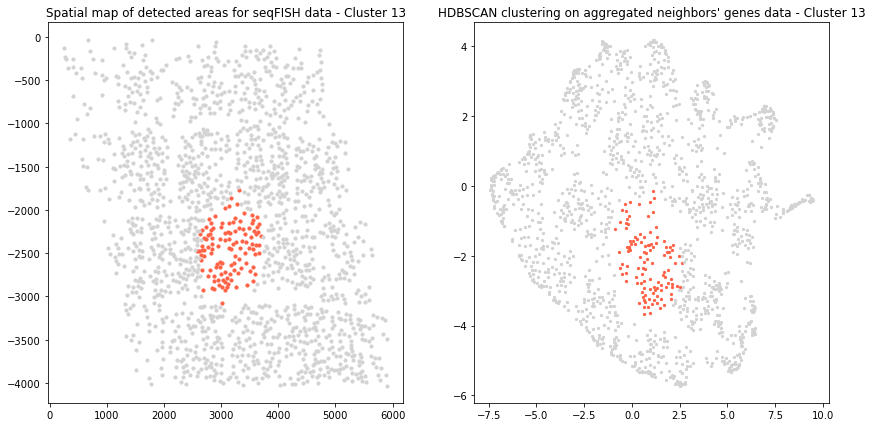

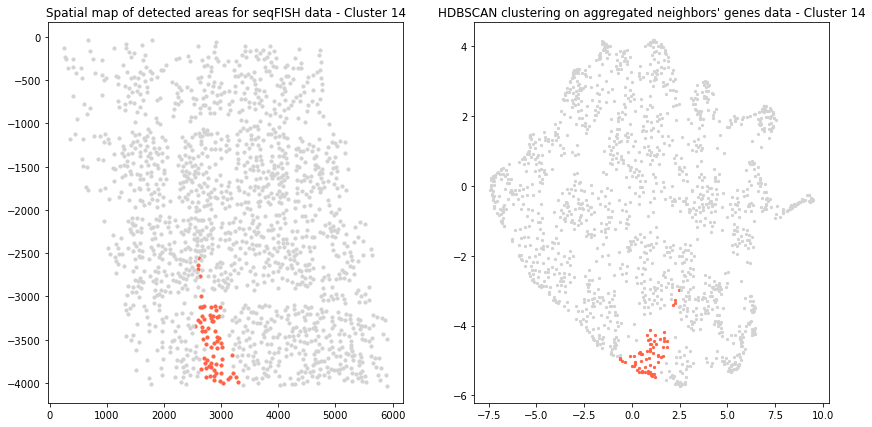

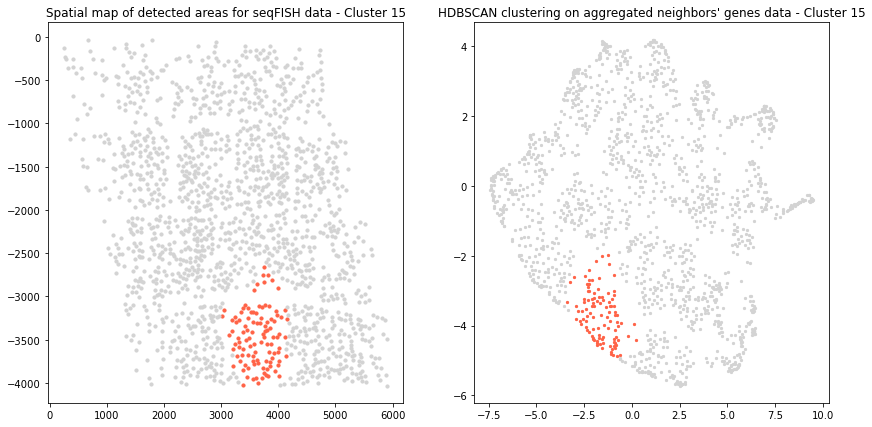

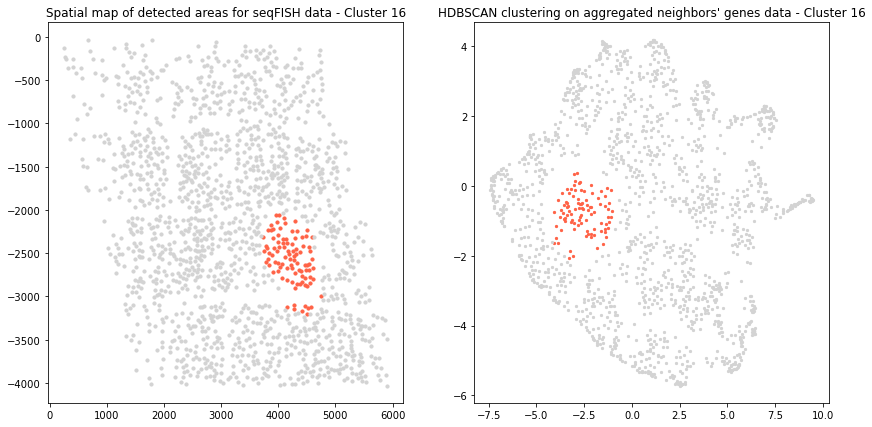

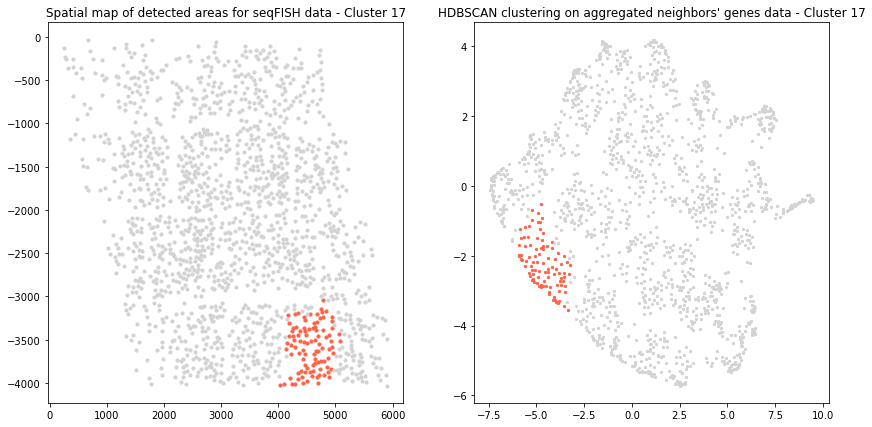

In [211]:
for clust_id in np.unique(labels_hdbs):
    clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
    clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

    fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

    ax[0].scatter(nodes.loc[clust_targ,'x'], nodes.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
    ax[0].scatter(nodes.loc[clust_comp,'x'], nodes.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
    ax[0].set_title('Spatial map of detected areas for seqFISH data - Cluster '+str(clust_id), fontsize=12);
    
    ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
    ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
    ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data - Cluster "+str(clust_id), fontsize=12);
    plt.show()

#### Manual DE analysis

In [289]:
from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

var_names = genes_aggreg.columns
distrib_pval = {'Welch': [],
                'Mann-Whitney': [],
                'Kolmogorov-Smirnov': []}
# target group of interest
GROUP_TGT = 0
# group of reference
GROUP_REF = 1
# GROUP_TGT = 16
# GROUP_REF = 11

select_1 = labels_hdbs == GROUP_TGT
select_2 = labels_hdbs == GROUP_REF
for var_name in var_names:
    dist1 = genes_aggreg.loc[select_1, var_name]
    dist2 = genes_aggreg.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
    mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
    distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [290]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

In [291]:
DE_pval.T.style.apply(highlight_under)

,abca15 mean,abca9 mean,acta2 mean,adcy4 mean,aldh3b2 mean,amigo2 mean,ankle1 mean,ano7 mean,anxa9 mean,arhgef26 mean,b3gat2 mean,barhl1 mean,blzf1 mean,bmpr1b mean,calb1 mean,capn13 mean,cdc5l mean,cdc6 mean,cdh1 mean,cecr2 mean,cilp mean,cldn5 mean,clec5a mean,col5a1 mean,cpne5 mean,creb1 mean,creb3l1 mean,csf2rb2 mean,ctla4 mean,cyp2c70 mean,cyp2j5 mean,dcstamp mean,dcx mean,ddb2 mean,egln3 mean,fam69c mean,fbll1 mean,foxa1 mean,foxd1 mean,foxd4 mean,galnt3 mean,gata6 mean,gda mean,gdf2 mean,gdf5 mean,gja1 mean,gm6377 mean,gm805 mean,gpc4 mean,hdx mean,hn1l mean,hnf1a mean,hoxb3 mean,hoxb8 mean,itpr2 mean,kcnip mean,kif16b mean,laptm5 mean,lefty2 mean,lhx3 mean,lmod1 mean,loxl1 mean,lyve1 mean,mertk mean,mfge8 mean,mgam mean,mmgt1 mean,mmp8 mean,mrc1 mean,mrgprb1 mean,murc mean,nell1 mean,nes mean,neurod4 mean,neurog1 mean,nfkb2 mean,nfkbiz mean,nhlh1 mean,nkd2 mean,nlrp12 mean,nov mean,npy2r mean,obsl1 mean,olr1 mean,omg mean,pax6 mean,pld1 mean,pld5 mean,poln mean,ppp1r3b mean,psmd5 mean,rbm31y mean,rhob mean,rrm2 mean,scml2 mean,sema3e mean,senp1 mean,serpinb11 mean,sis mean,slc4a8 mean,slc5a7 mean,slco1c1 mean,sox2 mean,spag6 mean,sumf2 mean,tbr1 mean,tnfrsf1b mean,vmn1r65 mean,vps13c mean,wrn mean,zfp182 mean,zfp715 mean,zfp90 mean,abca15 std,abca9 std,acta2 std,adcy4 std,aldh3b2 std,amigo2 std,ankle1 std,ano7 std,anxa9 std,arhgef26 std,b3gat2 std,barhl1 std,blzf1 std,bmpr1b std,calb1 std,capn13 std,cdc5l std,cdc6 std,cdh1 std,cecr2 std,cilp std,cldn5 std,clec5a std,col5a1 std,cpne5 std,creb1 std,creb3l1 std,csf2rb2 std,ctla4 std,cyp2c70 std,cyp2j5 std,dcstamp std,dcx std,ddb2 std,egln3 std,fam69c std,fbll1 std,foxa1 std,foxd1 std,foxd4 std,galnt3 std,gata6 std,gda std,gdf2 std,gdf5 std,gja1 std,gm6377 std,gm805 std,gpc4 std,hdx std,hn1l std,hnf1a std,hoxb3 std,hoxb8 std,itpr2 std,kcnip std,kif16b std,laptm5 std,lefty2 std,lhx3 std,lmod1 std,loxl1 std,lyve1 std,mertk std,mfge8 std,mgam std,mmgt1 std,mmp8 std,mrc1 std,mrgprb1 std,murc std,nell1 std,nes std,neurod4 std,neurog1 std,nfkb2 std,nfkbiz std,nhlh1 std,nkd2 std,nlrp12 std,nov std,npy2r std,obsl1 std,olr1 std,omg std,pax6 std,pld1 std,pld5 std,poln std,ppp1r3b std,psmd5 std,rbm31y std,rhob std,rrm2 std,scml2 std,sema3e std,senp1 std,serpinb11 std,sis std,slc4a8 std,slc5a7 std,slco1c1 std,sox2 std,spag6 std,sumf2 std,tbr1 std,tnfrsf1b std,vmn1r65 std,vps13c std,wrn std,zfp182 std,zfp715 std,zfp90 std
Welch,0.656300,0.000015,0.000000,0.025115,0.000007,0.000000,0.017781,0.599424,0.727327,0.210989,0.576096,0.300869,0.020272,0.006114,0.000116,0.038586,0.334729,0.273511,0.000000,0.012235,0.427600,0.000000,0.252290,0.000000,0.000000,0.000801,0.000329,0.060245,0.469496,0.731658,0.000000,0.035520,0.000000,0.381366,0.000000,0.016979,0.000061,0.217869,0.452170,0.000000,0.046080,0.000335,0.000000,0.004185,0.000000,0.002853,0.000043,0.051869,0.000017,0.086534,0.002145,0.109112,0.002535,0.004584,0.000000,0.000000,0.008670,0.000143,0.324845,0.003870,0.070644,0.196460,0.230202,0.000050,0.004421,0.000000,0.153527,0.000176,0.000000,0.000005,0.002055,0.000000,0.000000,0.193005,0.161462,0.021111,0.061211,0.138224,0.000206,0.001479,0.000000,0.001912,0.001296,0.006616,0.000005,0.772192,0.953422,0.009604,0.008234,0.000723,0.000130,0.001793,0.000000,0.008342,0.800304,0.000000,0.273348,0.000785,0.097645,0.004707,0.000000,0.936687,0.000001,0.001966,0.003664,0.000000,0.000000,0.000005,0.000185,0.000000,0.000000,0.000017,0.338794,0.024518,0.000001,0.000000,0.031778,0.001914,0.005236,0.136924,0.000000,0.097589,0.000000,0.033038,0.076070,0.467790,0.360206,0.000021,0.169380,0.005580,0.156534,0.011420,0.000001,0.000000,0.478875,0.000028,0.537182,0.000000,0.662393,0.000000,0.006506,0.302107,0.023908,0.085677,0.130626,0.000001,0.004877,0.000021,0.100480,0.003405,0.000291,0.000006,0.000001,0.000000,0.125335,0.617773,0.001452,0.000000,0.214393,0.000000,0.006072,0.942644,0.000000,0.002418,0.596197,0.000000,0.000001,0.000000,0.012740,0.001508,0.000005,0.161740,0.000010,0.000010,0.000013,0.000164,0.00

In [282]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

acta2 mean       0.000000
adcy4 mean       0.000000
pax6 mean        0.000000
gda mean         0.000000
gata6 mean       0.000000
                   ...   
ddb2 mean        0.039686
foxa1 std        0.042777
nlrp12 std       0.043147
lefty2 std       0.044704
arhgef26 mean    0.047268
Name: Kolmogorov-Smirnov, Length: 136, dtype: float64

In [145]:
import scanpy as sc

In [146]:
adata = sc.AnnData(genes_aggreg)
adata.obs['cell_clusters'] = pd.Series([str(x) for  x in labels_hdbs], dtype="category").values
# adata.obs['cell_clusters'] = labels_hdbs

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [ ]:
sc.tl.rank_genes_groups(adata, groupby='cell_clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

Compare to a single cluster.

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', groups=[str(GROUP_TGT)], reference=str(GROUP_REF), method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=[str(GROUP_TGT)], n_genes=15)

In [151]:
# error
# sc.pl.rank_genes_groups_violin(adata, groups=['1'], n_genes=8)

In [292]:
diff_var = DE_pval.loc[DE_pval['Mann-Whitney'] <= 0.05, 'Mann-Whitney'].sort_values()
var_names = diff_var.iloc[:20].index

select_1 = labels_hdbs == GROUP_TGT
select_2 = labels_hdbs == GROUP_REF

dist1 = genes_aggreg.loc[select_1, var_names]
dist2 = genes_aggreg.loc[select_2, var_names]
dist1['cluster'] = GROUP_TGT
dist2['cluster'] = GROUP_REF
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

In [293]:
wide = dist1.append(dist2)

In [294]:
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

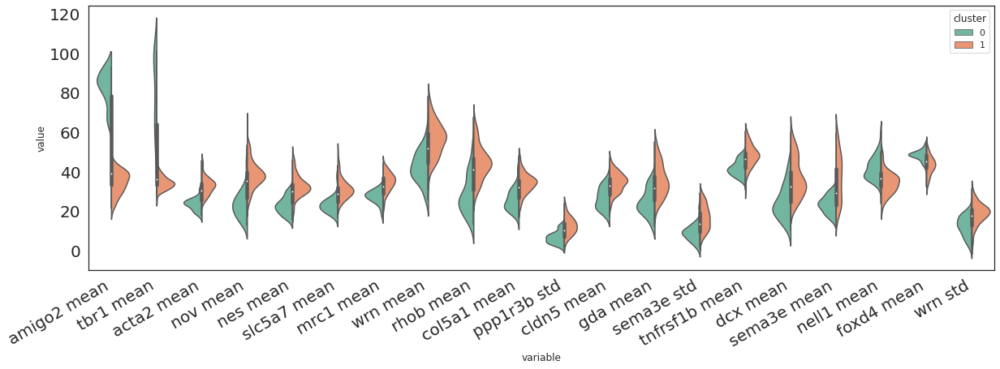

In [295]:
sns.set_style("white")
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'seqFISH - DE {} vs {}'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

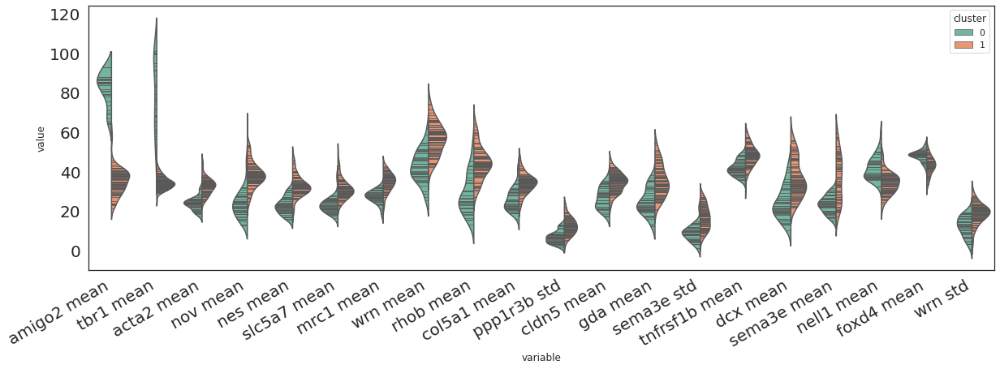

In [296]:
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True,
                    inner="stick")
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'seqFISH - DE {} vs {} sticks'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

In [138]:
mean_1 = dist1.loc[:,var_names].mean(axis=0)
mean_2 = dist2.loc[:,var_names].mean(axis=0)
ratio = mean_1 / mean_2
ratio.rename('ratio', inplace=True)

amigo2 mean      2.345519
tbr1 mean        2.333319
acta2 mean       0.727928
nov mean         0.613474
nes mean         0.698542
slc5a7 mean      0.741975
mrc1 mean        0.784068
wrn mean         0.752631
rhob mean        0.639761
col5a1 mean      0.758560
ppp1r3b std      0.540605
cldn5 mean       0.768361
gda mean         0.688562
sema3e std       0.540379
tnfrsf1b mean    0.867747
dcx mean         0.664937
sema3e mean      0.631931
nell1 mean       1.221806
foxd4 mean       1.116238
wrn std          0.658442
Name: ratio, dtype: float64

In [139]:
DE = DE_pval.join(ratio)
DE['logFC'] = np.log(DE['ratio'])
DE['-log10Pvalue'] = -np.log10(DE['Mann-Whitney'])
DE['significant'] = DE['Mann-Whitney'] < 0.05
DE

,Welch,Mann-Whitney,Kolmogorov-Smirnov,ratio,logFC,-log10Pvalue,significant
abca15 mean,6.563001e-01,4.876120e-01,9.617164e-01,NaN,NaN,0.311926,False
abca9 mean,1.495157e-05,1.812205e-06,4.714334e-07,NaN,NaN,5.741793,True
acta2 mean,8.008761e-26,6.319843e-19,4.440892e-16,0.727928,-0.317553,18.199294,True
adcy4 mean,2.511535e-02,1.792921e-02,1.055649e-01,NaN,NaN,1.746439,True
aldh3b2 mean,7.212853e-06,1.176184e-06,2.557019e-05,NaN,NaN,5.929525,True
...,...,...,...,...,...,...,...
vps13c std,1.430143e-07,2.050182e-07,3.128022e-07,NaN,NaN,6.688208,True
wrn std,5.106598e-10,5.919229e-10,2.677720e-08,0.658442,-0.417879,9.227735,True
zfp182 std,3.374768e-05,1.214420e-05,4.658258e-05,NaN,NaN,4.915631,True
zfp715 std,6.296237e-04,6.955651e-04,4.087626e-04,NaN,NaN,3.157662,True


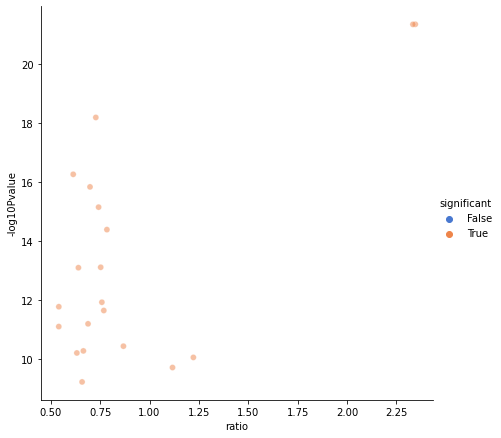

In [140]:
ax = sns.relplot(x="ratio", y="-log10Pvalue", hue="significant",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=DE)

In [403]:
# To annotate points, but there are nan due to negative values in log
# for index, row in DE.loc[DE['significant'], ['logFC', '-log10Pvalue']].iterrows():
# #     plt.annotate('actual group', xy=(x+0.2,y))
#     print(row['logFC'])

## Substraction of cell type contribution

In [44]:
data = seqFISH

umap_cell_types = umap.UMAP(n_components=2, random_state=0).fit_transform(data)

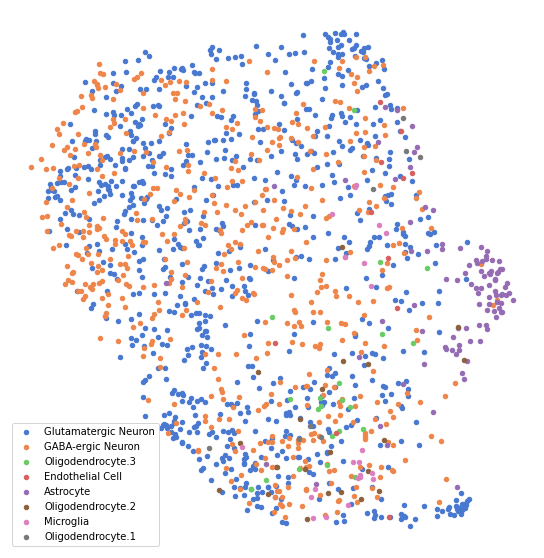

In [51]:
# ax = sns.relplot(
#      x=umap_cell_types[:,0], y=umap_cell_types[:,1],
#      hue=nodes['cell type'], palette='tab10')
# ax.set_axis_off()
# ax.set_aspect('equal')

fig, ax = plt.subplots(figsize=(10,10))
labels = nodes['cell type']
uniq = labels.unique()
# color nodes with manual colors
att_colors = sns.color_palette('muted').as_hex() 
color_mapper = dict(zip(uniq, att_colors))
for label in uniq:
    select = labels == label
    color = color_mapper[label]
    ax.scatter(umap_cell_types[select,0], umap_cell_types[select,1], c=color, label=label, s=20)
plt.legend()
ax.set_axis_off()
ax.set_aspect('equal')
# # plt.savefig(imdir.joinpath('seqFISH - UMAP cell type'), bbox_inches=('tight'))

In [52]:
# Get the mean contributions of each phenotype to mRNA counts
mean_pheno = {}
std_pheno = {}
for pheno in nodes['cell type'].unique():
    select = nodes[pheno].values.astype(bool)
    mean_var = data.loc[select,:].mean(axis=0)
    std_var = data.loc[select,:].std(axis=0)
    mean_pheno[pheno] = mean_var
    std_pheno[pheno] = std_var

In [53]:
# Retrieve the mean contributions of phenotypes
data_sub = copy.deepcopy(data)
for pheno in nodes['cell type'].unique():
    select = nodes[pheno].values.astype(bool)
    data_sub.loc[select,:] = data_sub.loc[select,:] - mean_pheno[pheno]

In [54]:
umap_sub = umap.UMAP(n_components=2, random_state=0).fit_transform(data_sub)

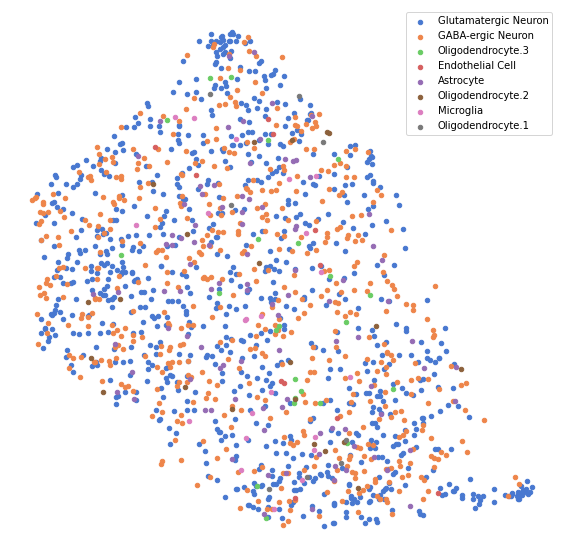

In [56]:
fig, ax = plt.subplots(figsize=(10,10))
labels = nodes['cell type']
uniq = labels.unique()
# color nodes with manual colors
att_colors = sns.color_palette('muted').as_hex() 
color_mapper = dict(zip(uniq, att_colors))
for label in uniq:
    select = labels == label
    color = color_mapper[label]
    ax.scatter(umap_sub[select,0], umap_sub[select,1], c=color, label=label, s=20)
plt.legend()
ax.set_axis_off()
ax.set_aspect('equal')
# # plt.savefig(imdir.joinpath('seqFISH - UMAP cell type substracted'), bbox_inches=('tight'))

### Aggregation

In [65]:
Xgene = data_sub.values

#### First order neighbors

In [66]:
genes_aggreg = nas.aggregate_k_neighbors(X=Xgene, pairs=pairs, order=1, var_names=seqFISH.columns)

In [67]:
# For the visualization
marker = 'o'
size_points = 10

In [68]:
reducer = umap.UMAP(random_state=0)
embedding = reducer.fit_transform(genes_aggreg)
embedding.shape

(1597, 2)

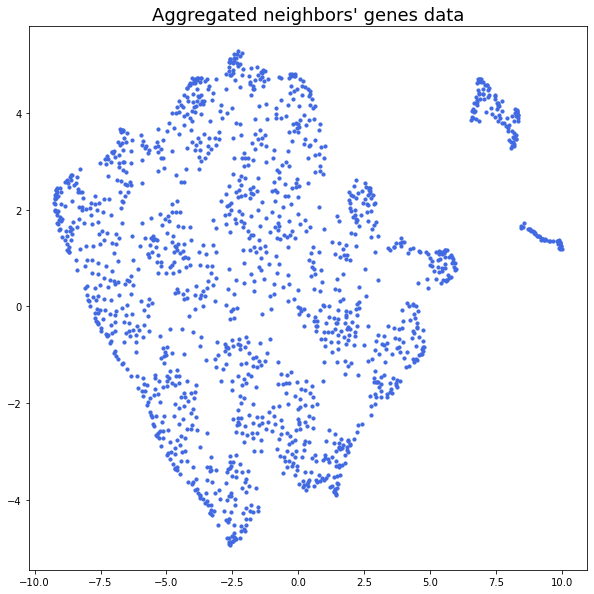

In [69]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' genes data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

The UMAP is different from the one during the BIRS workshop

In [70]:
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=15, min_samples=1, prediction_data=True)
    clusterer.fit(embedding)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=15, min_samples=1, prediction_data=True)
    labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)

HDBSCAN has detected 4 clusters


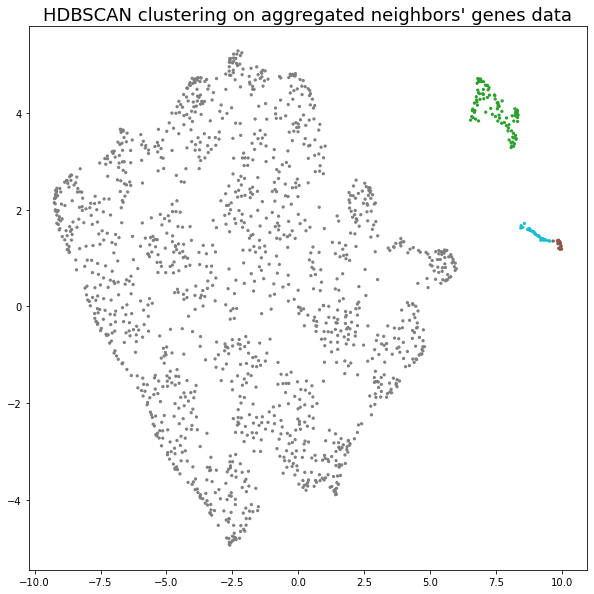

In [71]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_hdbs,
            s=5,
            cmap=hdbs_cmap);

title = "HDBSCAN clustering on aggregated neighbors' genes data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

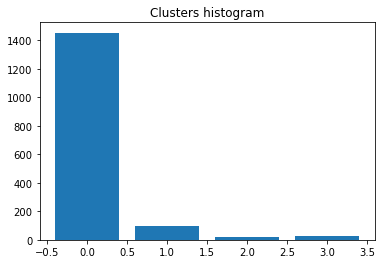

In [72]:
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

#### Visualisation of spatial seqFISH data and detected areas 

No handles with labels found to put in legend.


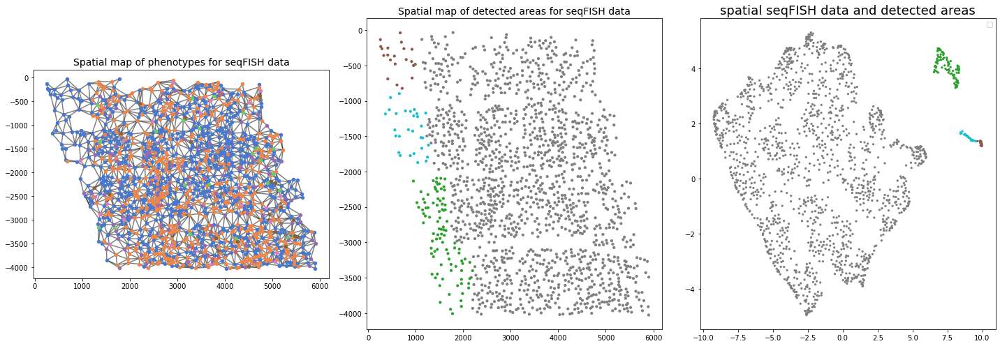

In [73]:
fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=True)

ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

ax[2].scatter(embedding[:, 0], embedding[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

title = "spatial seqFISH data and detected areas"
plt.title(title, fontsize=18);

#### Screening of order and clustering

In [ ]:
# data = data_sub
# nb_genes = data.shape[1]
# save_dir = Path(f'../data/processed/nb_genes {nb_genes}'+' - substracted')
# if not os.path.exists(save_dir):
#     os.makedirs(save_dir)

# orders = [1, 2, 3]

# for order in orders:
#     # compute statistics on aggregated data across neighbors
#     genes_aggreg = nas.aggregate_k_neighbors(X=data.values, pairs=pairs, order=order, var_names=data.columns)
    
#     # Dimension reduction for visualization
#     embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)

#     for dim_clust in [2,3,4,5,6,7,8,9]:
#         # Dimension reduction for clustering
#         embed_clust = umap.UMAP(n_neighbors=30,
#                                 min_dist=0.0,
#                                 n_components=dim_clust,
#                                 random_state=0,
#                                ).fit_transform(genes_aggreg)

#         for min_cluster_size in [10,20,30,40,50,60]:
#             # Clustering
#             if SOFT_CLUST:
#                 clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
#                 clusterer.fit(embed_clust)
#                 soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
#                 labels_hdbs = soft_clusters.argmax(axis=1)
#             else:
#                 clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
#                 clusterer.fit(embed_clust)
#                 labels_hdbs = clusterer.labels_
#             nb_clust_hdbs = labels_hdbs.max() + 1
#             print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
#             hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)

# #             # Histogram of classes
# #             fig = plt.figure()
# #             class_id, class_count = np.unique(labels_hdbs, return_counts=True)
# #             plt.bar(class_id, class_count, width=0.8);
# #             plt.title('Clusters histogram');
# #             title = f"Clusters histogram - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
# #             plt.savefig(save_dir / title, bbox_inches='tight')
# #             plt.show()            
                        
#             # Big summary plot
#             fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=False)

# #             ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0])
# #             ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);
# #             ax[0].legend()

#             ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
#             ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);

#             ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
#             ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);

#             suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
#             fig.suptitle(suptitle, fontsize=14)

#             fig.savefig(save_dir / suptitle, bbox_inches='tight')
#             plt.show()

In [303]:
# For the visualization
marker = 'o'
size_points = 10

data = data_sub
order = 1
dim_clust = 6
min_cluster_size = 40
nb_genes = data.shape[1]

# compute statistics on aggregated data across neighbors
genes_aggreg = nas.aggregate_k_neighbors(X=data.values, pairs=pairs, order=order, var_names=data.columns)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)


# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(genes_aggreg)

# Clustering
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    clusterer.fit(embed_clust)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
    clusterer.fit(embed_clust)
    labels_hdbs = clusterer.labels_

hdbs_cmap = nas.make_cluster_cmap(labels_hdbs)
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 16 clusters


No handles with labels found to put in legend.


Text(0.5, 0.98, 'Spatial seqFISH data and detected areas - nb_genes 113 - order 1 - dim_clust 6 - min_cluster_size 40')

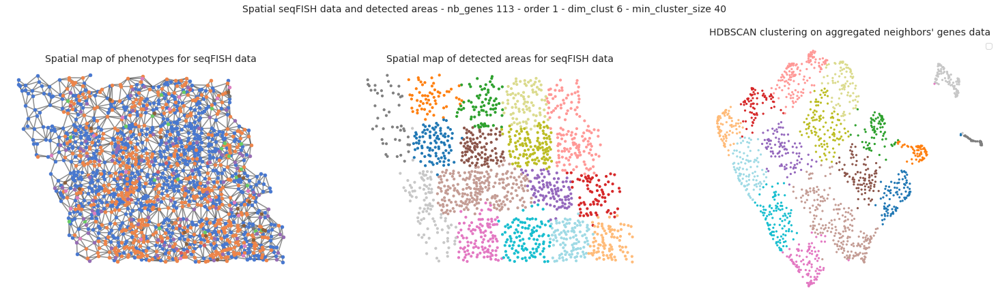

In [237]:
# # Histogram of classes
# fig = plt.figure()
# class_id, class_count = np.unique(labels_hdbs, return_counts=True)
# plt.bar(class_id, class_count, width=0.8);
# plt.title('Clusters histogram');

# Big summary plot
fig, ax = plt.subplots(1, 3, figsize=(26,7), tight_layout=False)

ty.plot_network(coords, pairs, labels=nodes['cell type'], size_nodes=20, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for seqFISH data', fontsize=14);
ax[0].set_axis_off()

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for seqFISH data', fontsize=14);
ax[1].set_aspect('equal')
ax[1].set_axis_off()

ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);
ax[1].set_aspect('equal')
ax[2].set_axis_off()

suptitle = f"Spatial seqFISH data and detected areas - nb_genes {nb_genes} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
fig.suptitle(suptitle, fontsize=14)

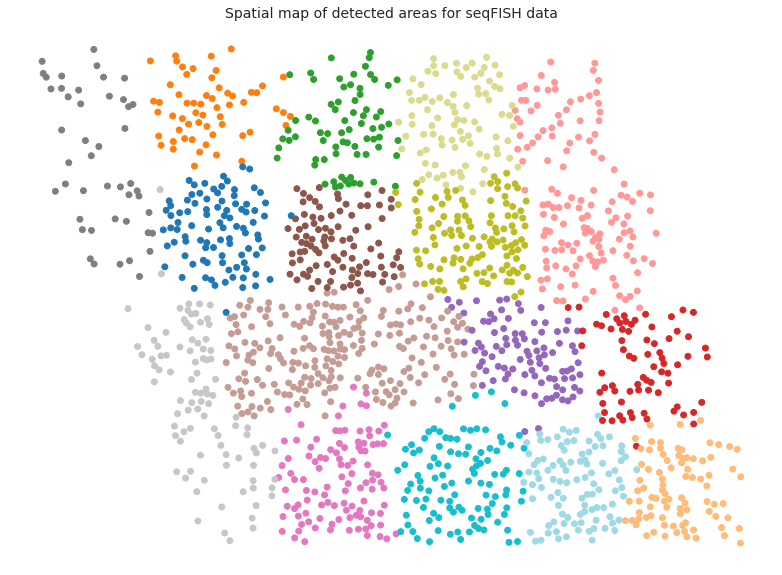

In [238]:
fig, ax = plt.subplots(figsize=(17,10))
ax.scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=35)
ax.set_title('Spatial map of detected areas for seqFISH data', fontsize=14);
ax.set_aspect('equal')
ax.set_axis_off()
plt.savefig(imdir.joinpath('seqFISH - substracted - detected area'), bbox_inches=('tight'))

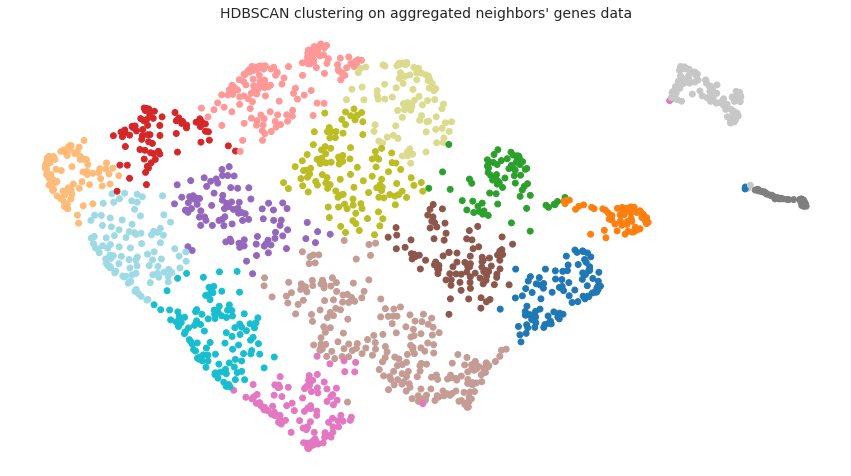

In [239]:
fig, ax = plt.subplots(figsize=(15,10))
ax.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=35, cmap=hdbs_cmap);
ax.set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);
ax.set_aspect('equal')
ax.set_axis_off()
plt.savefig(imdir.joinpath('seqFISH - substracted - clustering'), bbox_inches=('tight'))

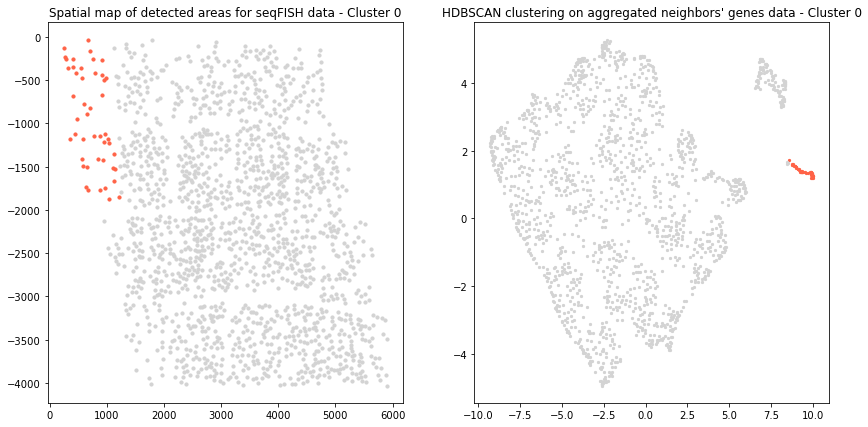

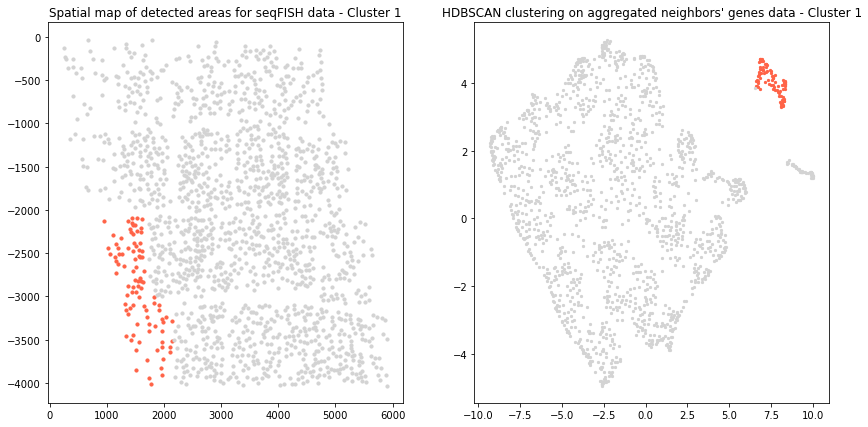

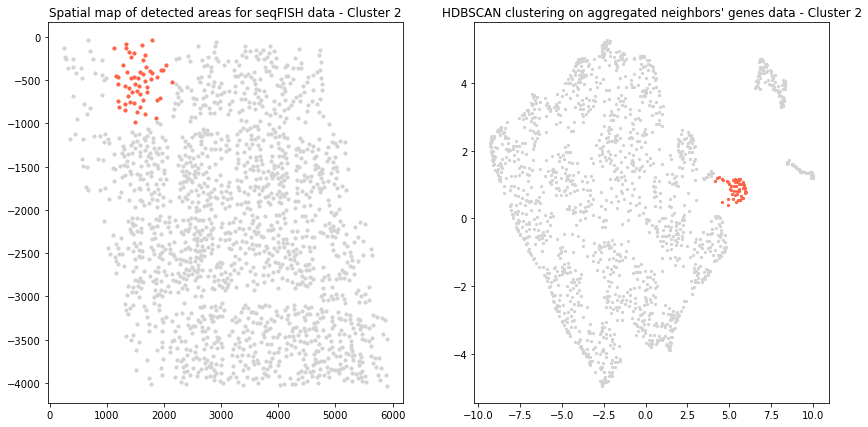

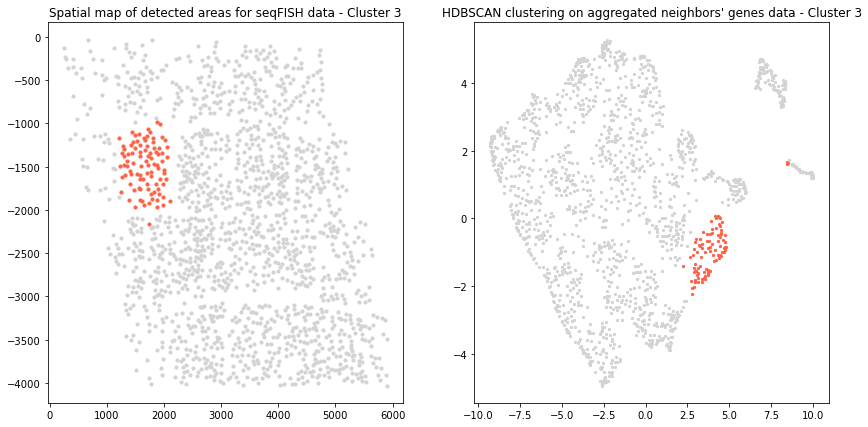

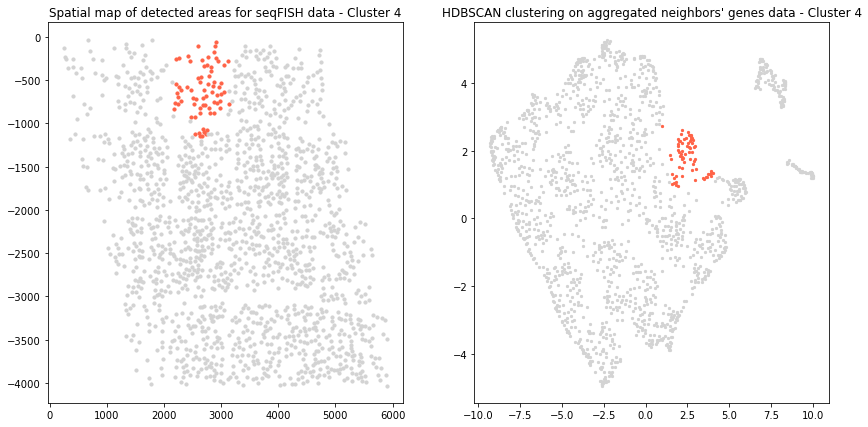

...

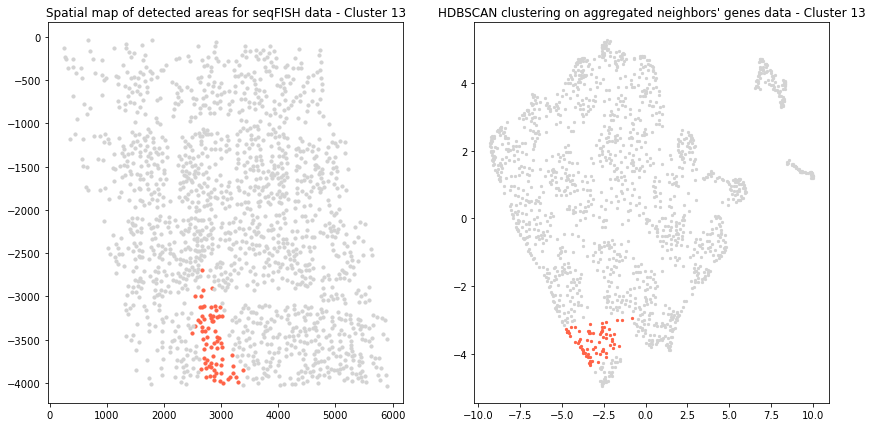

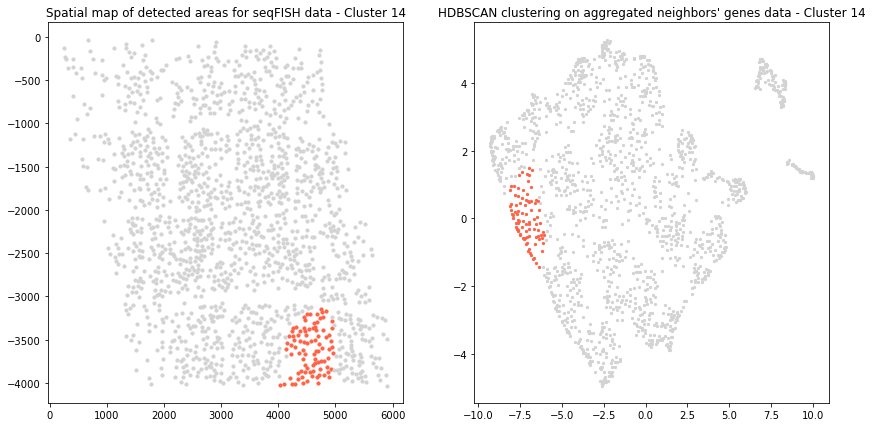

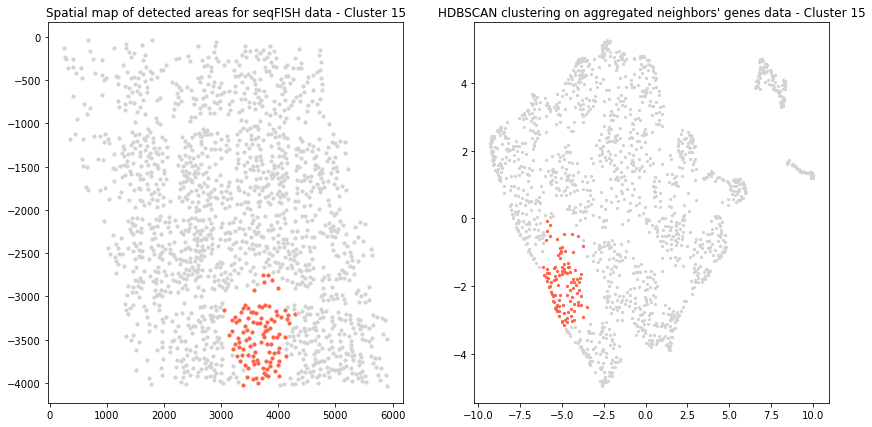

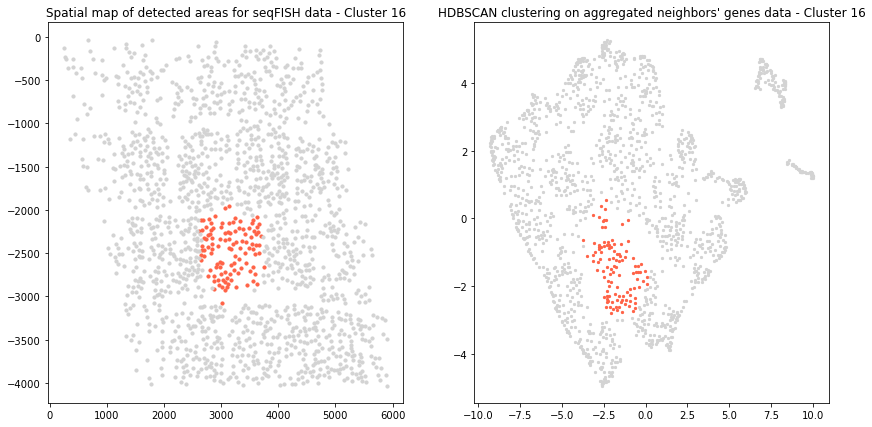

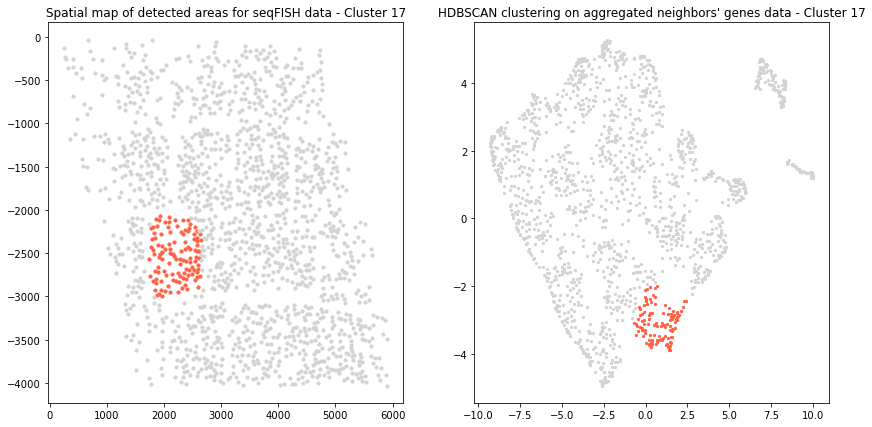

In [83]:
for clust_id in np.unique(labels_hdbs):
    clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
    clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

    fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

    ax[0].scatter(nodes.loc[clust_targ,'x'], nodes.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
    ax[0].scatter(nodes.loc[clust_comp,'x'], nodes.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
    ax[0].set_title('Spatial map of detected areas for seqFISH data - Cluster '+str(clust_id), fontsize=12);
    
    ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
    ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
    ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data - Cluster "+str(clust_id), fontsize=12);
    plt.show()

#### Manual DE analysis

In [312]:
from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

var_names = genes_aggreg.columns
distrib_pval = {'Welch': [],
                'Mann-Whitney': [],
                'Kolmogorov-Smirnov': []}
# target group of interest
GROUP_TGT = 0
# group of reference
GROUP_REF = 1
GROUP_TGT = 9
GROUP_REF = 10
select_1 = labels_hdbs == GROUP_TGT
select_2 = labels_hdbs == GROUP_REF
for var_name in var_names:
    dist1 = genes_aggreg.loc[select_1, var_name]
    dist2 = genes_aggreg.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
    mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
    distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [313]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

In [314]:
DE_pval.T.style.apply(highlight_under)

,abca15 mean,abca9 mean,acta2 mean,adcy4 mean,aldh3b2 mean,amigo2 mean,ankle1 mean,ano7 mean,anxa9 mean,arhgef26 mean,b3gat2 mean,barhl1 mean,blzf1 mean,bmpr1b mean,calb1 mean,capn13 mean,cdc5l mean,cdc6 mean,cdh1 mean,cecr2 mean,cilp mean,cldn5 mean,clec5a mean,col5a1 mean,cpne5 mean,creb1 mean,creb3l1 mean,csf2rb2 mean,ctla4 mean,cyp2c70 mean,cyp2j5 mean,dcstamp mean,dcx mean,ddb2 mean,egln3 mean,fam69c mean,fbll1 mean,foxa1 mean,foxd1 mean,foxd4 mean,galnt3 mean,gata6 mean,gda mean,gdf2 mean,gdf5 mean,gja1 mean,gm6377 mean,gm805 mean,gpc4 mean,hdx mean,hn1l mean,hnf1a mean,hoxb3 mean,hoxb8 mean,itpr2 mean,kcnip mean,kif16b mean,laptm5 mean,lefty2 mean,lhx3 mean,lmod1 mean,loxl1 mean,lyve1 mean,mertk mean,mfge8 mean,mgam mean,mmgt1 mean,mmp8 mean,mrc1 mean,mrgprb1 mean,murc mean,nell1 mean,nes mean,neurod4 mean,neurog1 mean,nfkb2 mean,nfkbiz mean,nhlh1 mean,nkd2 mean,nlrp12 mean,nov mean,npy2r mean,obsl1 mean,olr1 mean,omg mean,pax6 mean,pld1 mean,pld5 mean,poln mean,ppp1r3b mean,psmd5 mean,rbm31y mean,rhob mean,rrm2 mean,scml2 mean,sema3e mean,senp1 mean,serpinb11 mean,sis mean,slc4a8 mean,slc5a7 mean,slco1c1 mean,sox2 mean,spag6 mean,sumf2 mean,tbr1 mean,tnfrsf1b mean,vmn1r65 mean,vps13c mean,wrn mean,zfp182 mean,zfp715 mean,zfp90 mean,abca15 std,abca9 std,acta2 std,adcy4 std,aldh3b2 std,amigo2 std,ankle1 std,ano7 std,anxa9 std,arhgef26 std,b3gat2 std,barhl1 std,blzf1 std,bmpr1b std,calb1 std,capn13 std,cdc5l std,cdc6 std,cdh1 std,cecr2 std,cilp std,cldn5 std,clec5a std,col5a1 std,cpne5 std,creb1 std,creb3l1 std,csf2rb2 std,ctla4 std,cyp2c70 std,cyp2j5 std,dcstamp std,dcx std,ddb2 std,egln3 std,fam69c std,fbll1 std,foxa1 std,foxd1 std,foxd4 std,galnt3 std,gata6 std,gda std,gdf2 std,gdf5 std,gja1 std,gm6377 std,gm805 std,gpc4 std,hdx std,hn1l std,hnf1a std,hoxb3 std,hoxb8 std,itpr2 std,kcnip std,kif16b std,laptm5 std,lefty2 std,lhx3 std,lmod1 std,loxl1 std,lyve1 std,mertk std,mfge8 std,mgam std,mmgt1 std,mmp8 std,mrc1 std,mrgprb1 std,murc std,nell1 std,nes std,neurod4 std,neurog1 std,nfkb2 std,nfkbiz std,nhlh1 std,nkd2 std,nlrp12 std,nov std,npy2r std,obsl1 std,olr1 std,omg std,pax6 std,pld1 std,pld5 std,poln std,ppp1r3b std,psmd5 std,rbm31y std,rhob std,rrm2 std,scml2 std,sema3e std,senp1 std,serpinb11 std,sis std,slc4a8 std,slc5a7 std,slco1c1 std,sox2 std,spag6 std,sumf2 std,tbr1 std,tnfrsf1b std,vmn1r65 std,vps13c std,wrn std,zfp182 std,zfp715 std,zfp90 std
Welch,0.000010,0.000000,0.002057,0.000000,0.000000,0.000219,0.020224,0.175500,0.003287,0.000000,0.040850,0.118017,0.087485,0.000000,0.054440,0.000001,0.003443,0.231264,0.829049,0.000619,0.098993,0.018536,0.000831,0.000000,0.003684,0.000955,0.013829,0.897290,0.461014,0.000000,0.000000,0.000000,0.003535,0.000639,0.027982,0.175259,0.622873,0.000081,0.000002,0.000005,0.000228,0.476065,0.000002,0.517498,0.141528,0.000000,0.019621,0.000000,0.000000,0.000542,0.725753,0.000000,0.000000,0.000047,0.014612,0.083587,0.001080,0.111598,0.000003,0.023054,0.683929,0.000069,0.098686,0.000178,0.005457,0.000000,0.000000,0.016426,0.000000,0.848237,0.000000,0.136553,0.041396,0.002886,0.000029,0.000876,0.000000,0.002117,0.926877,0.000000,0.000034,0.000112,0.219769,0.000003,0.002540,0.000000,0.574953,0.000001,0.000000,0.594647,0.000706,0.167352,0.109934,0.041608,0.911674,0.000793,0.006287,0.000016,0.975934,0.035401,0.000000,0.007213,0.000000,0.000002,0.000003,0.064407,0.000000,0.885916,0.000000,0.000000,0.000000,0.029015,0.000000,0.093915,0.059686,0.257418,0.609668,0.106241,0.158318,0.173058,0.182998,0.000539,0.000062,0.928035,0.057581,0.875730,0.001751,0.029272,0.097761,0.851836,0.001441,0.000576,0.534669,0.000002,0.004984,0.212204,0.000000,0.000000,0.012263,0.111633,0.018240,0.580236,0.601553,0.746048,0.000170,0.000007,0.034502,0.283303,0.174647,0.000000,0.026277,0.003977,0.029563,0.724173,0.186024,0.007578,0.000040,0.000377,0.006425,0.003323,0.002352,0.001366,0.362121,0.244029,0.003380,0.000109,0.004022,0.000000,0.000141,0.727912,0.000009,0.000102,0.014486,0.162595,0.000022,0.037527,0.01

In [315]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

pax6 mean       6.001007e-73
slc5a7 mean     3.100626e-28
abca9 mean      3.759438e-25
mrc1 mean       7.341643e-23
nfkbiz mean     1.239993e-22
                    ...     
lyve1 mean      3.837007e-02
senp1 mean      4.310150e-02
egln3 mean      4.479319e-02
mgam std        4.815475e-02
arhgef26 std    4.815475e-02
Name: Kolmogorov-Smirnov, Length: 141, dtype: float64

In [88]:
import scanpy as sc

In [89]:
adata = sc.AnnData(genes_aggreg)
adata.obs['cell_clusters'] = pd.Series([str(x) for  x in labels_hdbs], dtype="category").values
# adata.obs['cell_clusters'] = labels_hdbs

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [ ]:
sc.tl.rank_genes_groups(adata, groupby='cell_clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

Compare to a single cluster.

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', groups=[str(GROUP_TGT)], reference=str(GROUP_REF), method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=[str(GROUP_TGT)], n_genes=15)

In [94]:
# error
# sc.pl.rank_genes_groups_violin(adata, groups=['1'], n_genes=8)

In [316]:
diff_var = DE_pval.loc[DE_pval['Mann-Whitney'] <= 0.05, 'Mann-Whitney'].sort_values()
var_names = diff_var.iloc[:20].index

select_1 = labels_hdbs == GROUP_TGT
select_2 = labels_hdbs == GROUP_REF

dist1 = genes_aggreg.loc[select_1, var_names]
dist2 = genes_aggreg.loc[select_2, var_names]
dist1['cluster'] = GROUP_TGT
dist2['cluster'] = GROUP_REF
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

In [317]:
wide = dist1.append(dist2)

In [318]:
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

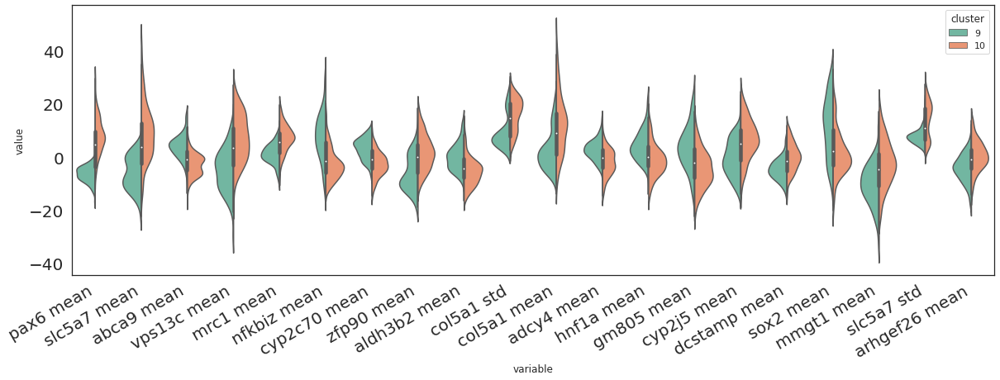

In [319]:
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'seqFISH - substracted - DE {} vs {}'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

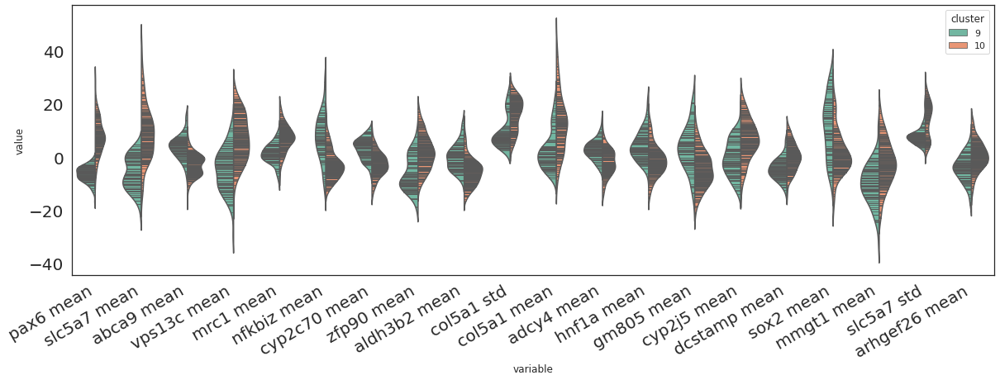

In [320]:
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True,
                    inner="stick")
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'seqFISH - substracted - DE {} vs {} sticks'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

In [100]:
mean_1 = dist1.loc[:,var_names].mean(axis=0)
mean_2 = dist2.loc[:,var_names].mean(axis=0)
ratio = mean_1 / mean_2
ratio.rename('ratio', inplace=True)

amigo2 mean    -5.070406
loxl1 mean      1.164148
cldn5 mean      2.171499
cpne5 mean      1.715048
nes mean        2.081148
sox2 mean       1.139678
acta2 mean      1.872053
kcnip mean      4.137055
slc5a7 mean     1.747280
aldh3b2 mean    1.737535
sema3e mean     3.268821
gda mean        3.498750
pax6 mean       0.979688
cpne5 std       0.678314
nov mean        4.888734
cyp2j5 mean     2.063333
cdc5l mean      1.500878
sox2 std        0.755271
egln3 mean      0.510950
calb1 mean      1.780112
Name: ratio, dtype: float64

In [101]:
DE = DE_pval.join(ratio)
DE['logFC'] = np.log(DE['ratio'])
DE['-log10Pvalue'] = -np.log10(DE['Mann-Whitney'])
DE['significant'] = DE['Mann-Whitney'] < 0.05
DE

/home/alexis/Programmes/Anaconda/envs/spatial-networks/lib/python3.7/site-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Welch,Mann-Whitney,Kolmogorov-Smirnov,ratio,logFC,-log10Pvalue,significant
abca15 mean,3.085533e-01,9.521297e-02,3.481754e-01,NaN,NaN,1.021304,False
abca9 mean,1.968701e-08,8.215435e-09,1.088943e-08,NaN,NaN,8.085369,True
acta2 mean,3.964817e-28,8.895126e-19,2.220446e-16,1.872053,0.627036,18.050848,True
adcy4 mean,6.188187e-04,4.044365e-04,2.599580e-03,NaN,NaN,3.393150,True
aldh3b2 mean,4.525664e-21,7.229499e-18,2.220446e-16,1.737535,0.552468,17.140892,True
...,...,...,...,...,...,...,...
vps13c std,3.789128e-11,3.328097e-10,9.970310e-10,NaN,NaN,9.477804,True
wrn std,7.678491e-02,7.533293e-02,1.066268e-01,NaN,NaN,1.123015,False
zfp182 std,4.575287e-10,1.682149e-09,2.064937e-09,NaN,NaN,8.774136,True
zfp715 std,1.202100e-04,2.747833e-04,3.086808e-04,NaN,NaN,3.561010,True


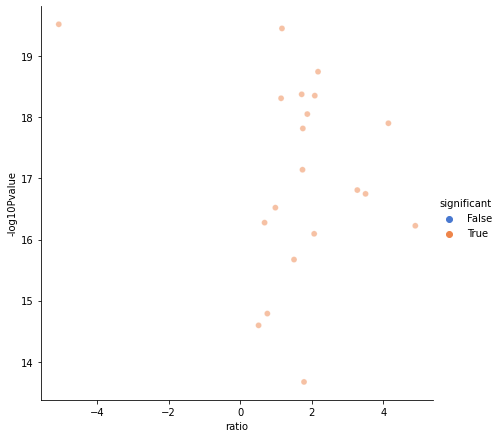

In [102]:
ax = sns.relplot(x="ratio", y="-log10Pvalue", hue="significant",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=DE)

#### Summary image for the white paper

In [ ]:
# pairs = vor.ridge_points[selection,:]
# marker = 'o'
# size_points = 10

# clf_name = 'Kernel SVC'
# nb_genes = scRNAseq_drop.shape[1]

# order = 2
# dim_clust = 2
# min_cluster_size = 40

# # compute statistics on aggregated data across neighbors
# genes_aggreg = aggregate_k_neighbors(X=Xpred, pairs=pairs, order=order, var_names=seqFISH_drop.columns)

# # Dimension reduction for visualization
# embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(genes_aggreg)


# # Dimension reduction for clustering
# embed_clust = umap.UMAP(n_neighbors=30,
#                         min_dist=0.0,
#                         n_components=dim_clust,
#                         random_state=0,
#                        ).fit_transform(genes_aggreg)


# clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
# clusterer.fit(embed_clust)
# labels_hdbs = clusterer.labels_
# nb_clust_hdbs = labels_hdbs.max() + 1
# print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

# # Big summary plot
# fig, ax = plt.subplots(1, 3, figsize=(25,9), tight_layout=True)

# # Network
# for points in voro_cells[selection,:]:
#     ax[0].plot(points[[0,2]],points[[1,3]],zorder=0, c='k', alpha=0.7, linewidth=0.5)
# for class_pred, label, color in color_labels:
#     select = class_pred == y_pred
#     ax[0].scatter(seqFISH_coords.loc[select,'x'], seqFISH_coords.loc[select,'y'], c=color, label=label, marker=marker, s=size_points, zorder=10)
# ax[0].set_title('Spatial network of predicted phenotypes', fontsize=14);
# ax[0].axis('off')
# ax[0].legend()

# # Detected areas
# ax[1].scatter(seqFISH_coords.loc[:,'x'], seqFISH_coords.loc[:,'y'], c=labels_hdbs, cmap=make_cluster_cmap(labels_hdbs), marker=marker, s=size_points)
# ax[1].set_title('Spatial map of detected areas', fontsize=14);
# ax[1].axis('off')

# # HDBSCAN clustering on UMAP projection
# ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, marker=marker, s=size_points, cmap=make_cluster_cmap(labels_hdbs));
# ax[2].set_title("HDBSCAN clustering on aggregated neighbors' genes data", fontsize=14);
# ax[2].axis('off')

# suptitle = f"Areas detection from seqFISH spatial network - nb_genes {nb_genes} - {clf_name} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
# # fig.suptitle(suptitle, fontsize=14)
# fig.savefig("../data/processed/"+suptitle, bbox_inches='tight')
# plt.show()